**Data Preprocessing - Bejaia**

Importing Libraries


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.metrics import  mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import math
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
import lightgbm as lgb
import optuna

Loading the dataset


In [37]:
df = pd.read_csv('Sidi-Bel_Abbes_Region_Dataset.csv') #loads the dataset for Portugal wildfires
print(df.head(), '\n') #displays the first five rows of the dataset
print(df.info(), '\n') #displays summary information and the column names and datatypes of the dataset
print(df.describe()) #displays the statistical summary of the numerical columns of the dataset

   day  month  year  Temperature   RH   Ws  Rain   FFMC  DMC    DC  ISI  BUI  \
0    1      6  2012           32   71   12    0.7  57.1  2.5   8.2  0.6  2.8   
1    2      6  2012           30   73   13    4.0  55.7  2.7   7.8  0.6  2.9   
2    3      6  2012           29   80   14    2.0  48.7  2.2   7.6  0.3  2.6   
3    4      6  2012           30   64   14    0.0  79.4  5.2  15.4  2.2  5.6   
4    5      6  2012           32   60   14    0.2  77.1  6.0  17.6  1.8  6.5   

   FWI    Classes    
0  0.2  not fire     
1  0.2  not fire     
2  0.1  not fire     
3  1.0  not fire     
4  0.9  not fire      

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122 entries, 0 to 121
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   day          122 non-null    int64  
 1   month        122 non-null    int64  
 2   year         122 non-null    int64  
 3   Temperature  122 non-null    int64  
 4    RH          122 non-nu

Handling of missing values and duplicate instances 

In [38]:
#checks for duplicates and missing values before cleaning 
print("duplicates:", df.duplicated().sum())  #checks for duplicates  
print("missing values:", df.isnull().sum().sum()) #checks for missing values

#cleans the dataset for both duplicates and missing values 
df.drop_duplicates(inplace=True) #removes duplicates 
df.dropna(inplace=True) #removes any missing values 

# confirms that duplicates and missing values have been removed
print("duplicates:", df.duplicated().sum())  #checks for duplicates  
print("missing values:", df.isnull().sum().sum()) #checks for missing values

duplicates: 0
missing values: 1
duplicates: 0
missing values: 0


**Data Visualisation and Analysis**

Monthly fire occurence visualisation and analysis

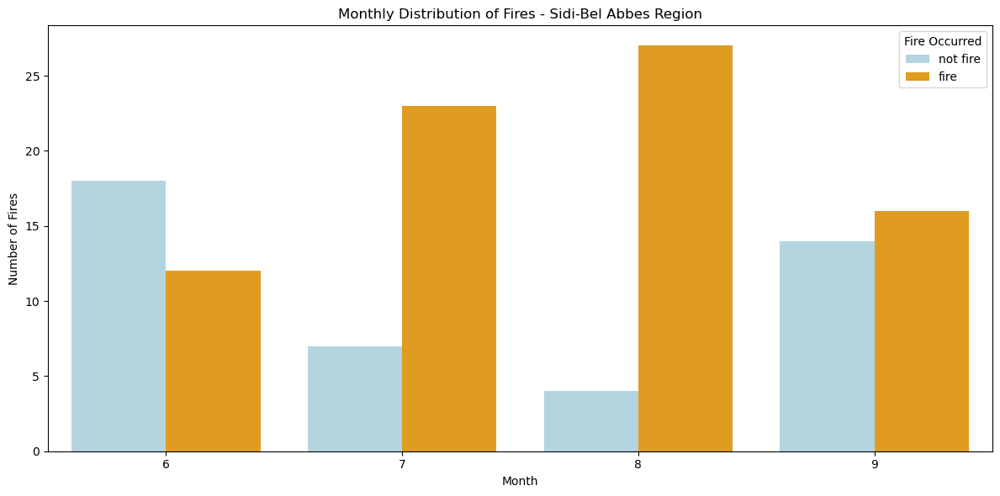

In [ ]:
df.columns = df.columns.str.strip() #clean up the column names to ensure no hidden spaces


df['Classes'] = df['Classes'].str.strip()


df['month'] = df['month'].astype(str) #month column is converted to string so that seaborn treats it as a catergorical variable

month_order = [str(i) for i in range(6,10)] #only months june to september are selected


plt.figure(figsize=(12, 6)) #plots how many fire and non-fire occurences are present 
sns.countplot(
    data=df,
    x='month',
    hue='Classes',
    order=month_order,
    palette={'fire': 'orange', 'not fire': 'lightblue'}
)

plt.title("Monthly Distribution of Fires - Sidi-Bel Abbes Region")
plt.xlabel("Month")
plt.ylabel("Number of Fires")
plt.legend(title='Fire Occurred')
plt.tight_layout()
plt.show()
#reference: https://seaborn.pydata.org/tutorial/distributions.html
#reference : https://github.com/sai-manas/FWI_Predictor_ML/blob/main/notebook/Algerian_forest_ML_project.ipynb

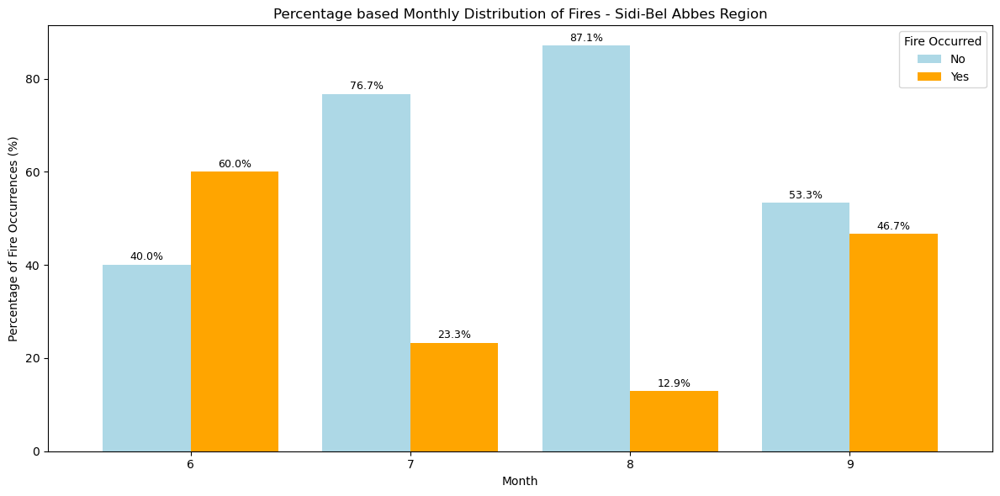

In [ ]:
month_order = [str(i) for i in range(6, 10)] #month order is defined and only months June to spetember are used 

df['month'] = df['month'].astype(str) #month column is converted to string to make a catergorical variable 
df['month'] = pd.Categorical(df['month'], categories=month_order, ordered=True) #ensures the month appears correctly
df['Classes'] = df['Classes'].str.strip().str.lower() #removes any extra spaces in this column

fire_recorded = df.groupby(['month', 'Classes'], observed=True).size().unstack(fill_value=0)
fire_occurred_percentage = fire_recorded.div(fire_recorded.sum(axis=1), axis=0) * 100 #converts the previous found counts to percentages to accurately compare the fires and non-fires 

ax = fire_occurred_percentage.plot( #plots a barchat with the fire occured Vs not occured percentages
    kind='bar',
    color=['lightblue', 'orange'],
    figsize=(12,6),\
    width=0.8
)

plt.title("Percentage based Monthly Distribution of Fires - Sidi-Bel Abbes Region")
plt.xlabel("Month")
plt.ylabel("Percentage of Fire Occurrences (%)")
plt.legend(title='Fire Occurred', labels=['No','Yes'])
plt.xticks(rotation=0)
plt.tight_layout()

for p in ax.patches: #percentage labels for each bar is added (for clarity)
    ax.text(
        p.get_x() + p.get_width()/2,
        p.get_height() + 0.5,
        f'{p.get_height():.1f}%',
        ha='center',
        va='bottom',
        fontsize=9
    )

plt.show()



#reference: https://seaborn.pydata.org/tutorial/distributions.html
#reference: https://github.com/sai-manas/FWI_Predictor_ML/blob/main/notebook/Algerian_forest_ML_project.ipynb

Correlation Heat Map 

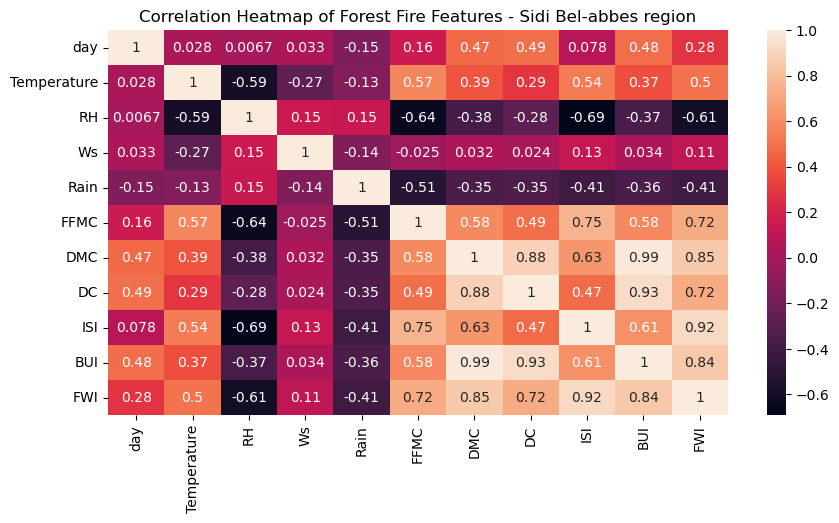

In [41]:
#plots the correlation heatmap  

corr_df = df.select_dtypes(include=[float, int]).drop(columns=['year'])

corr_matrix = corr_df.corr()

plt.figure(figsize=(10, 5))
sns.heatmap(
    corr_matrix,
    annot=True,
)
plt.title("Correlation Heatmap of Forest Fire Features - Sidi Bel-abbes region")
plt.show()
#reference: https://python-graph-gallery.com/92-control-color-in-seaborn-heatmaps/
#reference: https://www.geeksforgeeks.org/python/how-to-create-a-seaborn-correlation-heatmap-in-python/

Handling of Catergorical Values 

In [42]:
#uses label encoding to map catergorical features to its respective numerical values for month, day, season, Classes

Classes_map = {'fire':1, 'not fire':0}

df['Classes'] = df['Classes'].map(Classes_map)

#reference: https://pandas.pydata.org/docs/dev/reference/api/pandas.Categorical.map.html

Distribution of each feature 

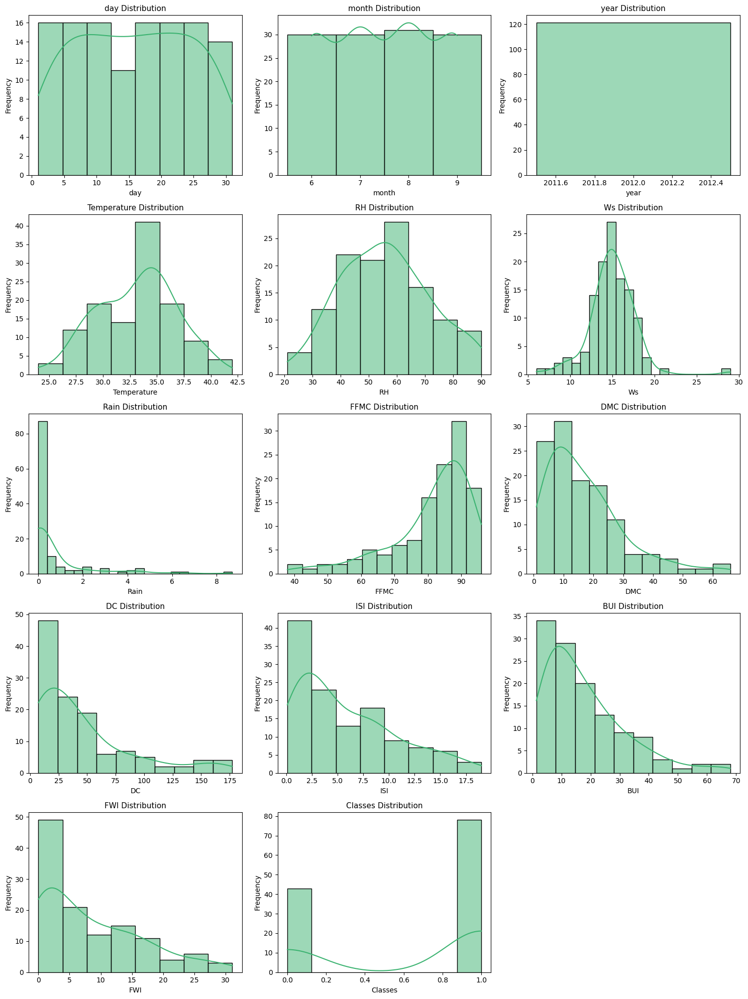

In [43]:

variables = df.columns #all columns in the dataset is used for distribution plotting
cols = 3  #sets the number of plots per row for the figure layout
rows = math.ceil(len(variables) / cols) #calculates the now of rows needed for the figure layout

plt.figure(figsize=(5*cols, 4*rows)) #sets the figure size based on the total number of rows and columns needed

for i, col in enumerate(variables, 1): #iterates thrugh each column 
    plt.subplot(rows, cols, i) #creates a subplot for each column 
    sns.histplot(df[col], kde=True, color='mediumseagreen', edgecolor='black') 
    plt.title(f'{col} Distribution', fontsize=11) #sets the title for each subplot
    plt.xlabel(col) #sets the x-axis label as the column name for each subplot
    plt.ylabel('Frequency') #sets the y-axis label as the frequency for each subplot 

plt.tight_layout()
plt.show()

#reference: https://www.w3schools.com/c/ref_math_ceil.php
#reference: https://www.w3schools.com/python/ref_func_enumerate.asp
#reference: https://www.statology.org/matplotlib-distribution-plot/

**Feature Scaling**

In [44]:
features = df.columns.drop('FWI') #all columns excepts FWI is used as the input features
target = 'FWI' #target variable is set as FWI

X = df[features]
y = df[target]

scaler = StandardScaler()  #standard scaler is used for feature scaling (z-score normalisation)
X_scaled = scaler.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, columns=features)

print("Summary after feature scaling:") #the statistical summary is displayed after feature scaling
print(X_scaled.describe().round(2))


Summary after feature scaling:
          day   month   year  Temperature      RH      Ws    Rain    FFMC  \
count  121.00  121.00  121.0       121.00  121.00  121.00  121.00  121.00   
mean     0.00    0.00    0.0        -0.00    0.00   -0.00   -0.00    0.00   
std      1.00    1.00    0.0         1.00    1.00    1.00    1.00    1.00   
min     -1.67   -1.35    0.0        -2.50   -2.24   -3.35   -0.46   -3.53   
25%     -0.88   -0.45    0.0        -0.86   -0.77   -0.37   -0.46   -0.29   
50%      0.03    0.44    0.0         0.24   -0.00    0.01   -0.46    0.30   
75%      0.82    0.44    0.0         0.78    0.70    0.38   -0.12    0.68   
max      1.72    1.34    0.0         2.42    2.17    5.23    5.39    1.22   

          DMC      DC     ISI     BUI  Classes  
count  121.00  121.00  121.00  121.00   121.00  
mean    -0.00   -0.00   -0.00   -0.00     0.00  
std      1.00    1.00    1.00    1.00     1.00  
min     -1.24   -0.90   -1.20   -1.20    -1.35  
25%     -0.76   -0.72   -0.84 

Box plot visualisation 

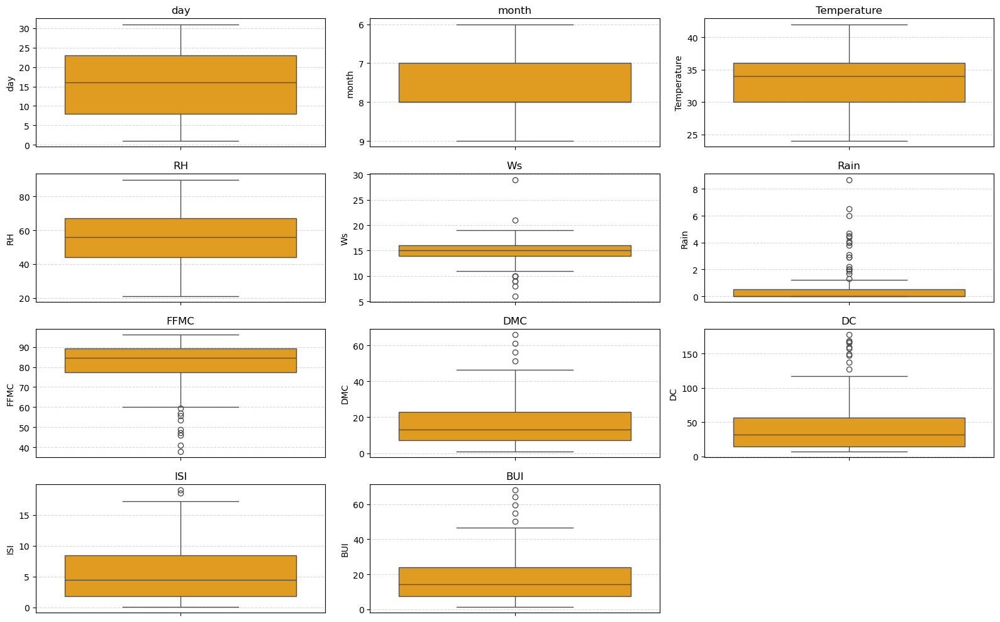

In [45]:

#box plot visualisation of the features after feature scaling
features = ["day", "month",	"Temperature","RH","Ws","Rain", "FFMC","DMC","DC","ISI","BUI"] #only the most relevant features are plotted (research is based on weather data and fire indices)

plt.figure(figsize=(16, 10))
for i, feature in enumerate(features, 1):
    plt.subplot(4, 3, i)      #creates a subplot for each feature and includes it in a 3 by 3 grid layout
    sns.boxplot(y=df[feature], color="orange")
    plt.title(feature)
    plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()
#reference: https://stackoverflow.com/questions/59593943/multiple-boxplots-of-all-categorical-variables-in-one-plotting-window-using-seab

Handling of Outliers

Original dataset size: 121
Dataset size after capping outliers: 121


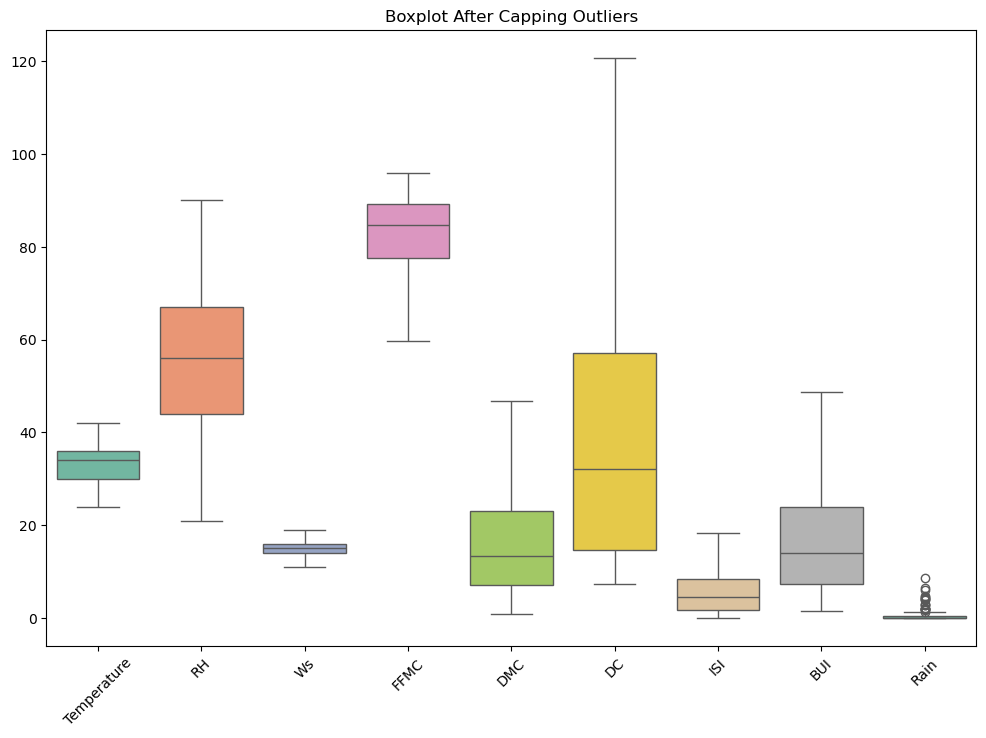

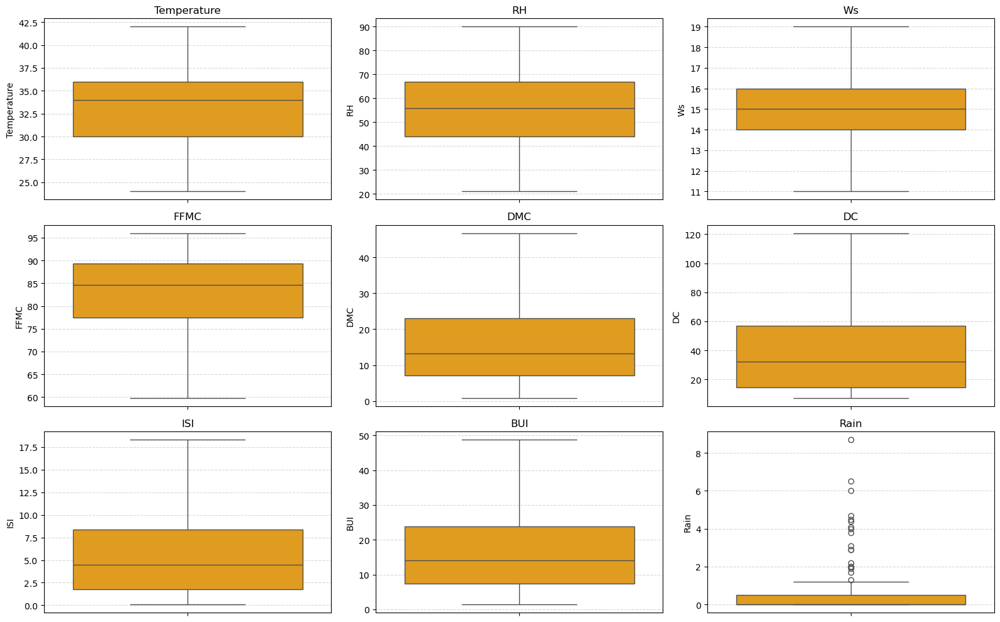

In [46]:

# following fuction is used to limit extreme values using IQR method


def cap_outliers(df, columns, factor=1.5): # k = 1.5 
    df = df.copy()
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - factor * IQR
        upper = Q3 + factor * IQR
        df[col] = np.clip(df[col], lower, upper) #caps/replaces values outside the lower and upper bounds 
    return df

features =  ["Temperature","RH","Ws", "FFMC","DMC","DC","ISI","BUI"] #most relavant features (numerical) for the FWI is used 

df = cap_outliers(df, features) #caps the outliers using the preivously defined function (cap_outliers)

print(f"Original dataset size: {df.shape[0]}")
print(f"Dataset size after capping outliers: {df.shape[0]}")  # prints the size of the dataset after capping outliers to ensure the size is unchanged


scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[features +['Rain']]) #features scales the capped dataset

#plots boxplots to visualise the capped outliers and ensure no outliers are present
plt.figure(figsize=(12,8))
sns.boxplot(data=df[features+['Rain']], palette="Set2")
plt.title("Boxplot After Capping Outliers")
plt.xticks(rotation=45)
plt.show()

# plots individual boxplots for a better visualisation of each feature in a 3 by 3 grid layout (easier to compare with the previous boxplot before capping)
plt.figure(figsize=(16, 10))
for i, feature in enumerate(features+['Rain'], 1):
    plt.subplot(3, 3, i)
    sns.boxplot(y=df[feature], color="orange")
    plt.title(feature)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()
#reference: https://www.geeksforgeeks.org/data-visualization/box-plot-in-python-using-matplotlib/
#reference: https://stackoverflow.com/questions/42207920/how-to-take-floor-and-capping-for-removing-outliers
#reference: https://stackoverflow.com/questions/59593943/multiple-boxplots-of-all-categorical-variables-in-one-plotting-window-using-seab

**Feature Importance**

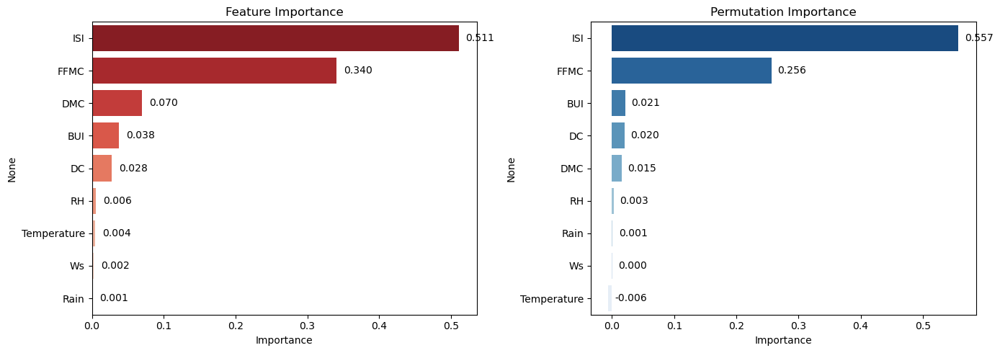

Feature Importance Comparison:
             Built-in  Permutation
BUI             0.038        0.021
DC              0.028        0.020
DMC             0.070        0.015
FFMC            0.340        0.256
ISI             0.511        0.557
RH              0.006        0.003
Rain            0.001        0.001
Temperature     0.004       -0.006
Ws              0.002        0.000


In [47]:

features = ["Temperature","RH","Ws", "Rain","FFMC","DMC","DC","ISI","BUI"] #same most relevant features as before is used 
target = 'FWI'

X = df[features] #capped dataset is used for training the RF model 
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) #data is split into 80% training and 20% testing

model = RandomForestRegressor(n_estimators=100, random_state=42) #random forest regressor model is used with 100 trees/estimators 
model.fit(X_train, y_train)

#mdi feature importance and permutation feature importance are calculated
mdi_importances = pd.Series(model.feature_importances_, index=features).sort_values(ascending=False) #built-in feature importance from the random forest model 
perm_result = permutation_importance(model, X_test, y_test, n_repeats=10, random_state=42) 
perm_importances = pd.Series(perm_result.importances_mean, index=features).sort_values(ascending=False)


fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot for MDI - built-in feature importance
sns.barplot(x=mdi_importances.values, y=mdi_importances.index, hue=mdi_importances.index, 
            palette='Reds_r', ax=axes[0], legend=False)
axes[0].set_title('Feature Importance')
axes[0].set_xlabel('Importance')

for i, v in enumerate(mdi_importances.values): #values for each bar is added on the barplot
    axes[0].text(v + 0.01, i, f'{v:.3f}', va='center', fontsize=10)

# Plot 2 for the permutation feature importance
sns.barplot(x=perm_importances.values, y=perm_importances.index, hue=perm_importances.index,
            palette='Blues_r', ax=axes[1], legend=False)
axes[1].set_title('Permutation Importance')
axes[1].set_xlabel('Importance')

for i, v in enumerate(perm_importances.values): #values for each bar is added on the barplot
    axes[1].text(v + 0.01, i, f'{v:.3f}', va='center', fontsize=10)

plt.tight_layout()
plt.show()

#feature comparison table is printed 
print("Feature Importance Comparison:")
print(pd.DataFrame({'Built-in': mdi_importances, 'Permutation': perm_importances}).round(3))

#reference: https://www.geeksforgeeks.org/machine-learning/feature-importance-with-random-forests/ (built-in feature importance)
#reference: https://scikit-learn.org/stable/modules/permutation_importance.html
#reference: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py

Pearson Correlation 

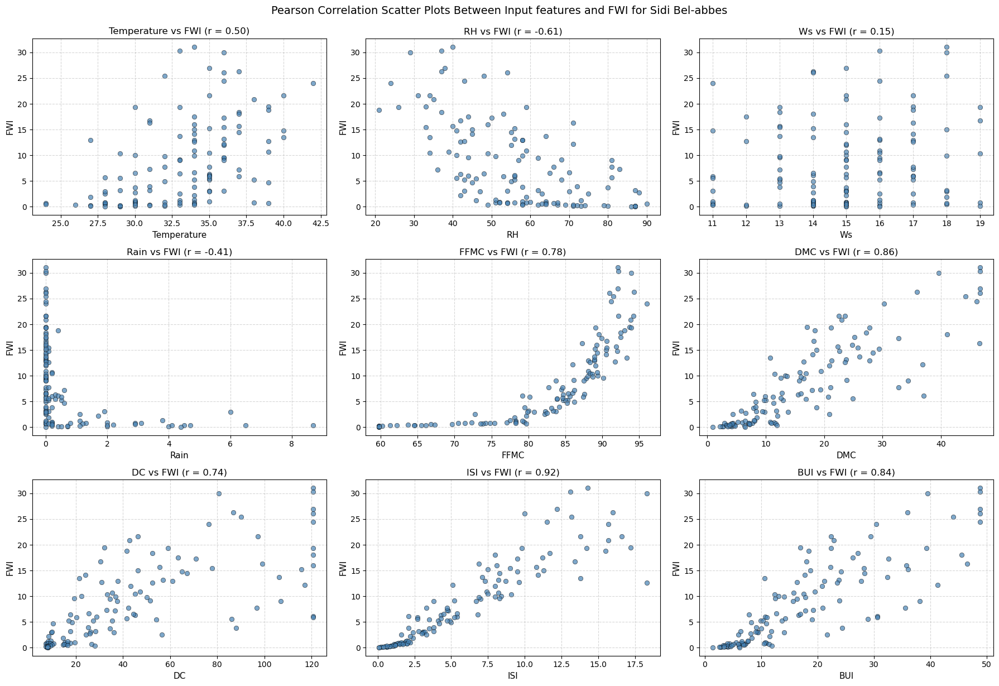

Pearson correlation coefficients for features and FWI:
Temperature: 0.501
RH: -0.606
Ws: 0.151
Rain: -0.410
FFMC: 0.780
DMC: 0.855
DC: 0.738
ISI: 0.919
BUI: 0.845


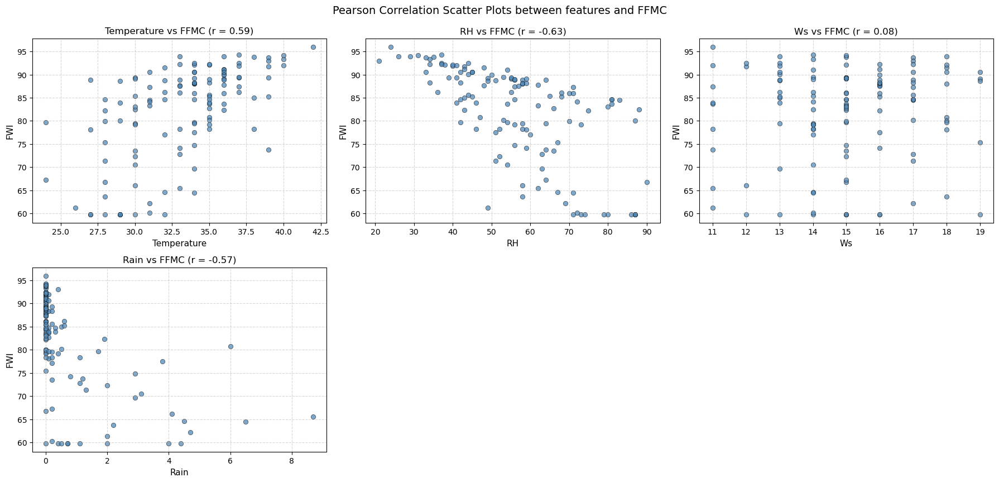

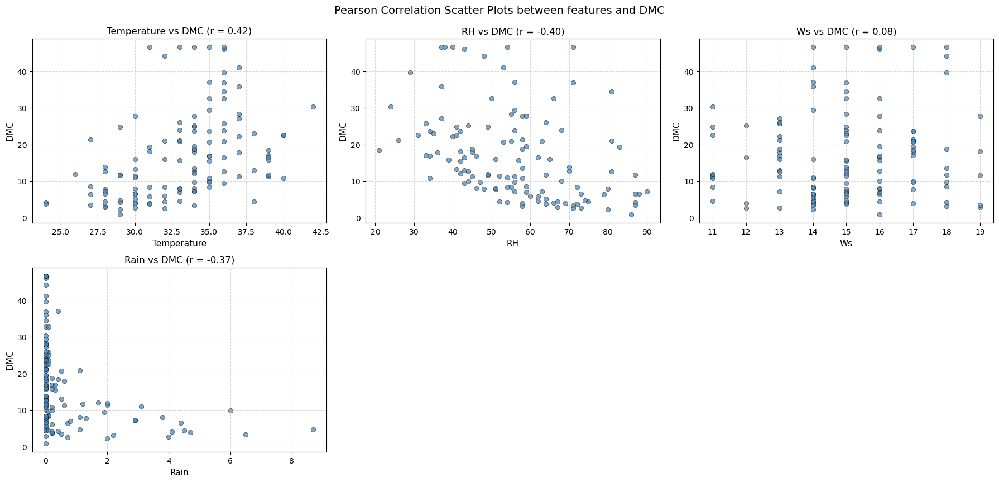

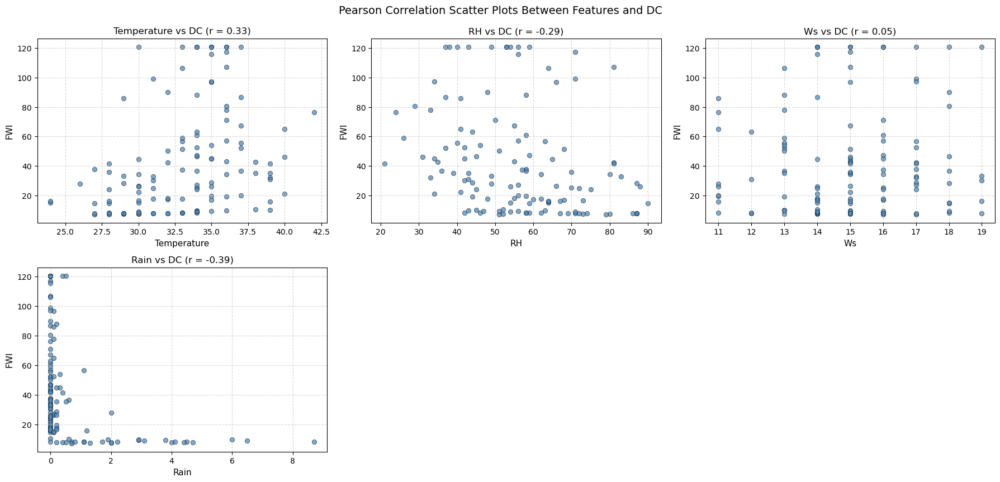

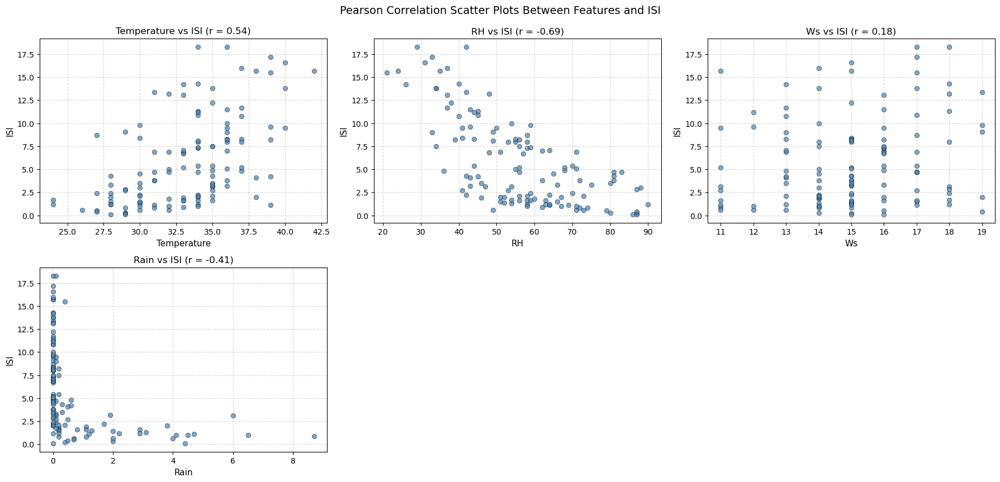

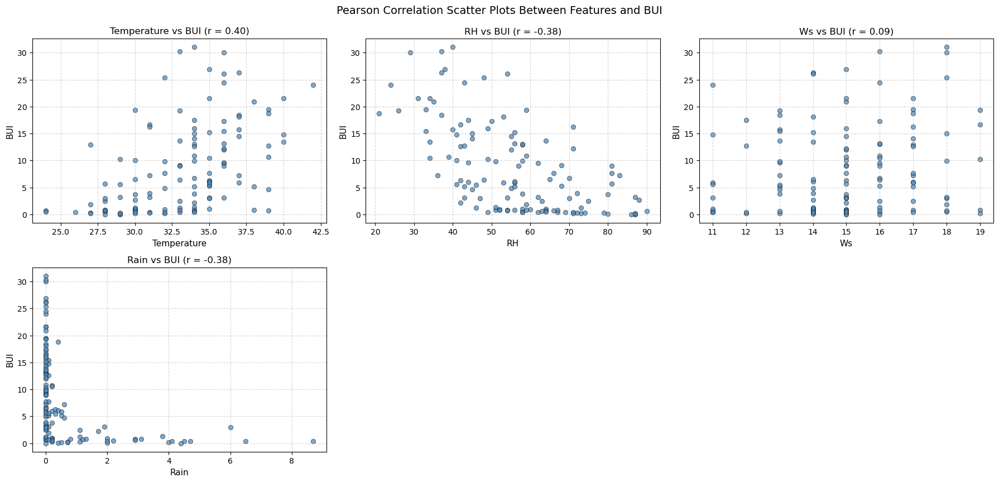

In [ ]:
X = df[features]  #input features that include the following columns ('FFMC', 'DMC', 'DC', 'ISI', 'BUI', 'temp', 'RH', 'wind', 'rain)             
y = df['FWI']     #target output feature 


def covariance(X, y): #calculates the mean differences between the variables
    x_mean = np.mean(X)
    y_mean = np.mean(y)
    return sum((X[i] - x_mean) * (y[i] - y_mean) for i in range(len(X))) / len(X)

def pearson_correlation(X, y): #function to calculate pearson correlation matrix
    cov = covariance(X, y)
    std_dev_x = np.std(X)
    std_dev_y = np.std(y)
    if std_dev_x == 0 or std_dev_y == 0: 
        return np.nan  
    return cov / (std_dev_x * std_dev_y) #divides the calculated value in covariance function by the standard deviation (this value is the pearson correlation coefficient and it shows the relationship between the input feature and the output featue)

plt.figure(figsize=(18, 12))
for i, feature in enumerate(features, 1): #plots the scatter plot (this shows the relationship between the intput feature and the output feature)
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[feature],
        y=df['FWI'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    
    
    if np.std(df[feature]) == 0 or np.std(df['FWI']) == 0:  #Calculates Pearson correlation coefficent for each feature
        r = np.nan
    else:
        r = np.corrcoef(df[feature], df['FWI'])[0, 1]

    plt.title(f'{feature} vs FWI (r = {r:.2f})', fontsize=12) #plots the scatter plot
    plt.xlabel(feature, fontsize=11)
    plt.ylabel('FWI', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots Between Input features and FWI for Sidi Bel-abbes", fontsize=14, y=1.02)
plt.show()

correlations = {}
for col in X.columns:
    correlations[col] = pearson_correlation(X[col].values, y.values)

print("Pearson correlation coefficients for features and FWI:")
for feature, r in correlations.items():
    print(f"{feature}: {r:.3f}")

#(Additional), the pearson coeffficents for each feature is printed 
#the following pearson correlation coefficients are found and scatter plots are plotted for each index to get a better understanding about the feature relations 
#Pearson correlation for FFMC
weather_features = ["Temperature","RH","Ws","Rain"]
X = df[weather_features]               
y = df['FFMC']

plt.figure(figsize=(18, 12))
for i, weather_feature in enumerate(weather_features, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[weather_feature],
        y=df['FFMC'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    
    # correlation for each feature is calculated
    if np.std(df[weather_feature]) == 0 or np.std(df['FFMC']) == 0:
        r = np.nan
    else:
        r = np.corrcoef(df[weather_feature], df['FFMC'])[0, 1]

    plt.title(f'{weather_feature} vs FFMC (r = {r:.2f})', fontsize=12)
    plt.xlabel(weather_feature, fontsize=11)
    plt.ylabel('FWI', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots between features and FFMC", fontsize=14, y=1.02)
plt.show()

#Pearson correlation for DMC

X = df[weather_features]               
y = df['DMC']

plt.figure(figsize=(18, 12))
for i, weather_feature in enumerate(weather_features, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[weather_feature],
        y=df['DMC'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    
    # correlation for each feature is calculated
    if np.std(df[weather_feature]) == 0 or np.std(df['DMC']) == 0:
        r = np.nan
    else:
        r = np.corrcoef(df[weather_feature], df['DMC'])[0, 1]

    plt.title(f'{weather_feature} vs DMC (r = {r:.2f})', fontsize=12)
    plt.xlabel(weather_feature, fontsize=11)
    plt.ylabel('DMC', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots between features and DMC", fontsize=14, y=1.02)
plt.show()

#pearson correlation for DC

X = df[weather_features]               
y = df['DC']

plt.figure(figsize=(18, 12))
for i, weather_feature in enumerate(weather_features, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[weather_feature],
        y=df['DC'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    
    # correlation for each feature is calculated
    if np.std(df[weather_feature]) == 0 or np.std(df['DC']) == 0:
        r = np.nan
    else:
        r = np.corrcoef(df[weather_feature], df['DC'])[0, 1]

    plt.title(f'{weather_feature} vs DC (r = {r:.2f})', fontsize=12)
    plt.xlabel(weather_feature, fontsize=11)
    plt.ylabel('FWI', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots Between Features and DC", fontsize=14, y=1.02)
plt.show() 

#pearson correlation for ISI

X = df[weather_features]               
y = df['ISI']

plt.figure(figsize=(18, 12))
for i, weather_feature in enumerate(weather_features, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[weather_feature],
        y=df['ISI'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    

    if np.std(df[weather_feature]) == 0 or np.std(df['ISI']) == 0: # correlation for each feature is calculated
        r = np.nan
    else:
        r = np.corrcoef(df[weather_feature], df['ISI'])[0, 1]

    plt.title(f'{weather_feature} vs ISI (r = {r:.2f})', fontsize=12)
    plt.xlabel(weather_feature, fontsize=11)
    plt.ylabel('ISI', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots Between Features and ISI", fontsize=14, y=1.02)
plt.show()

#pearson correlation for BUI

X = df[weather_features]               
y = df['BUI']

plt.figure(figsize=(18, 12))
for i, weather_feature in enumerate(weather_features, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[weather_feature],
        y=df['FWI'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    
    \
    if np.std(df[weather_feature]) == 0 or np.std(df['BUI']) == 0: # correlation for each feature is calculated
        r = np.nan
    else:
        r = np.corrcoef(df[weather_feature], df['BUI'])[0, 1]

    plt.title(f'{weather_feature} vs BUI (r = {r:.2f})', fontsize=12)
    plt.xlabel(weather_feature, fontsize=11)
    plt.ylabel('BUI', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots Between Features and BUI", fontsize=14, y=1.02)
plt.show()


#reference: https://medium.com/@shivogojohn/pearson-correlation-coefficient-in-python-74fb569f2b7f


**Model Development**

Model 1 - using all input features 

XGBoost model with hyperparameter tuning

[I 2025-11-09 14:06:11,661] A new study created in memory with name: no-name-64fdc75e-ba45-476f-af75-b57a8a1ca6e7


  0%|          | 0/1000 [00:00<?, ?it/s]

[0]	test-rmse:5.40508
[1]	test-rmse:3.35306
[2]	test-rmse:2.49174
[3]	test-rmse:1.80126
[4]	test-rmse:1.59239
[5]	test-rmse:1.34843
[6]	test-rmse:1.33686
[7]	test-rmse:1.33461
[8]	test-rmse:1.33483
[9]	test-rmse:1.32566
[10]	test-rmse:1.32406
[11]	test-rmse:1.34546
[12]	test-rmse:1.35164
[13]	test-rmse:1.36450
[14]	test-rmse:1.38355
[15]	test-rmse:1.38116
[16]	test-rmse:1.38332
[17]	test-rmse:1.39969
[18]	test-rmse:1.41831
[19]	test-rmse:1.42633
[20]	test-rmse:1.42055
[21]	test-rmse:1.42055
[22]	test-rmse:1.42867
[23]	test-rmse:1.44277
[24]	test-rmse:1.43888
[25]	test-rmse:1.45387
[26]	test-rmse:1.44921
[27]	test-rmse:1.44011
[28]	test-rmse:1.44011
[29]	test-rmse:1.44669
[30]	test-rmse:1.44416
[31]	test-rmse:1.44693
[32]	test-rmse:1.44935
[33]	test-rmse:1.44672
[34]	test-rmse:1.44672
[35]	test-rmse:1.45973
[36]	test-rmse:1.45973
[37]	test-rmse:1.45973
[38]	test-rmse:1.45973
[39]	test-rmse:1.46326
[40]	test-rmse:1.45602
[41]	test-rmse:1.46436
[42]	test-rmse:1.46436
[43]	test-rmse:1.4643

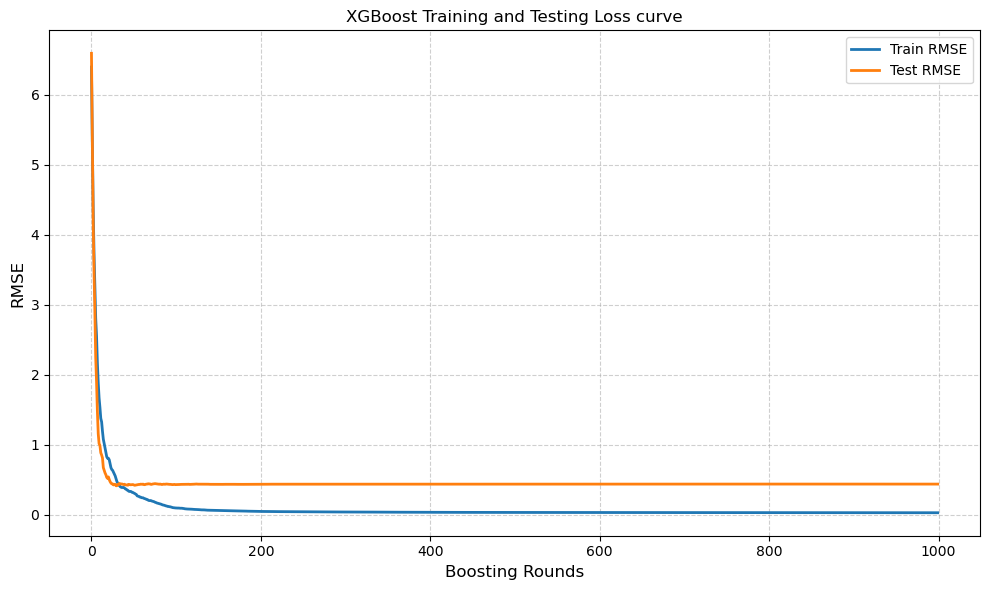

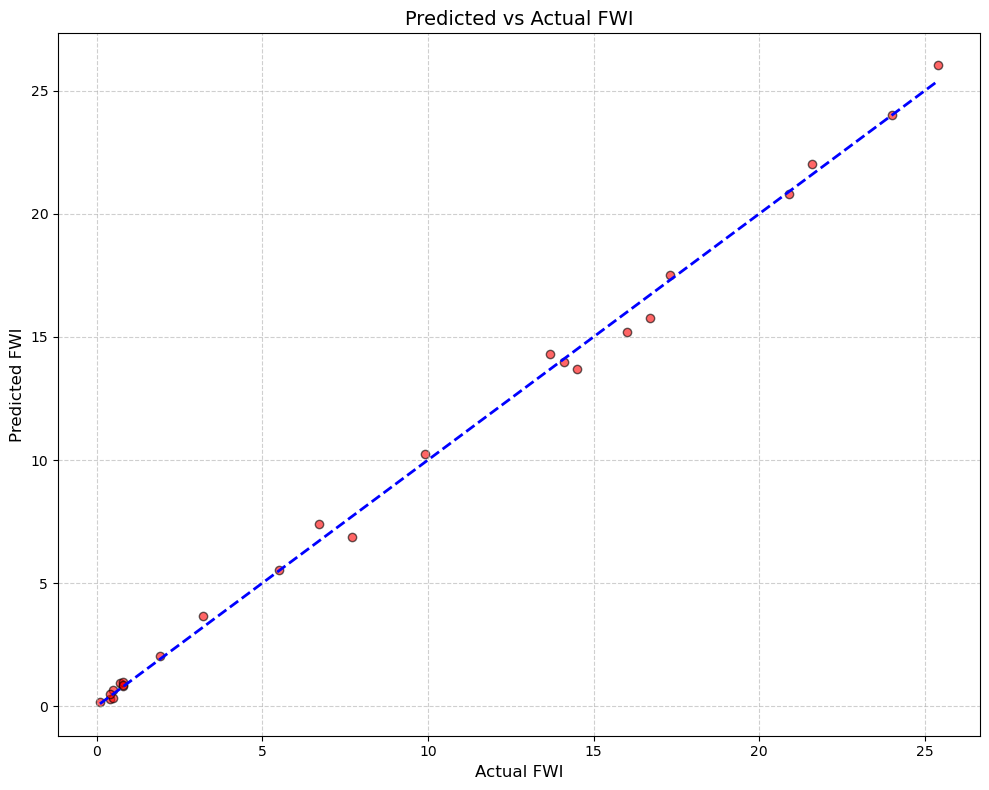

In [49]:
features = ["Temperature","RH","Ws", "Rain","FFMC","DMC","DC","ISI","BUI"]
target = 'FWI'

X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=0) #splits the dataset to 80% training and 20% testing 

xgb_train = xgb.DMatrix(X_train, y_train) #converts the inputs to a DMatrix object 
xgb_test = xgb.DMatrix(X_test, y_test)


def objective(trial): #the hyperparameter tuning objective function is defined 
    params = {
        "objective": "reg:squarederror",
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.5),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "lambda": trial.suggest_float("lambda", 1e-8, 5),
        "alpha": trial.suggest_float("alpha", 1e-8, 5),
        "seed": 42
    }
    
    model = xgb.train(params=params, dtrain=xgb_train, num_boost_round=100, #model is trained using the intially defined parameters
                      evals=[(xgb_test, 'test')],
                      verbose_eval=True)
    
    preds = model.predict(xgb_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    return rmse

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=1000, show_progress_bar=True)
best_params = study.best_params.copy()
best_params['objective'] = 'reg:squarederror'
best_params['seed'] = 42
print ("Best hyperparameters:", best_params)  #using optuna the best parameters are found 

#loss curve plotting
evals_result = {}
final_model = xgb.train(   #the final model is trained on the best parameters
    params=best_params,
    dtrain=xgb_train,
    num_boost_round=1000,
    evals=[(xgb_train, 'train'), (xgb_test, 'test')],
    evals_result=evals_result,
    verbose_eval=True
)

preds = final_model.predict(xgb_test)   
r2 = r2_score(y_test, preds)
rmse = np.sqrt(mean_squared_error(y_test, preds))
mae = np.mean(np.abs((y_test - preds)))

print(f"R² Score: {r2:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"MAE: {mae:.3f}")

train_rmse_val = evals_result['train']['rmse']
test_rmse_val = evals_result['test']['rmse']

plt.figure(figsize=(10, 6))
plt.plot(train_rmse_val, label='Train RMSE', linewidth=2)
plt.plot(test_rmse_val, label='Test RMSE', linewidth=2)
plt.xlabel('Boosting Rounds', fontsize=12)
plt.ylabel('RMSE', fontsize=12)
plt.title('XGBoost Training and Testing Loss curve', fontsize=12) #loss curve is plotted
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 8))
plt.scatter(y_test, preds, color='red', alpha=0.6, edgecolor='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2)  #Predicted VS Actual plot is plotted
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show() 
 

#reference: https://www.geeksforgeeks.org/machine-learning/implementation-of-xgboost-extreme-gradient-boosting/
#reference: https://xgboost.readthedocs.io/en/stable/python/examples/evals_result.html
#reference: hhttps://machinelearningmastery.com/tune-xgboost-performance-with-learning-curves/ttps://machinelearningmastery.com/tune-xgboost-performance-with-learning-curves/   (to confirm the shape of the learning curve)
#reference: https://github.com/ishandandekar/misc/blob/8711f9bcd8866ed3f220b2bf3f647993c6884283/xgboost_optuna.py#L15-L17

XGBoost Model without hyperparameter tuning 

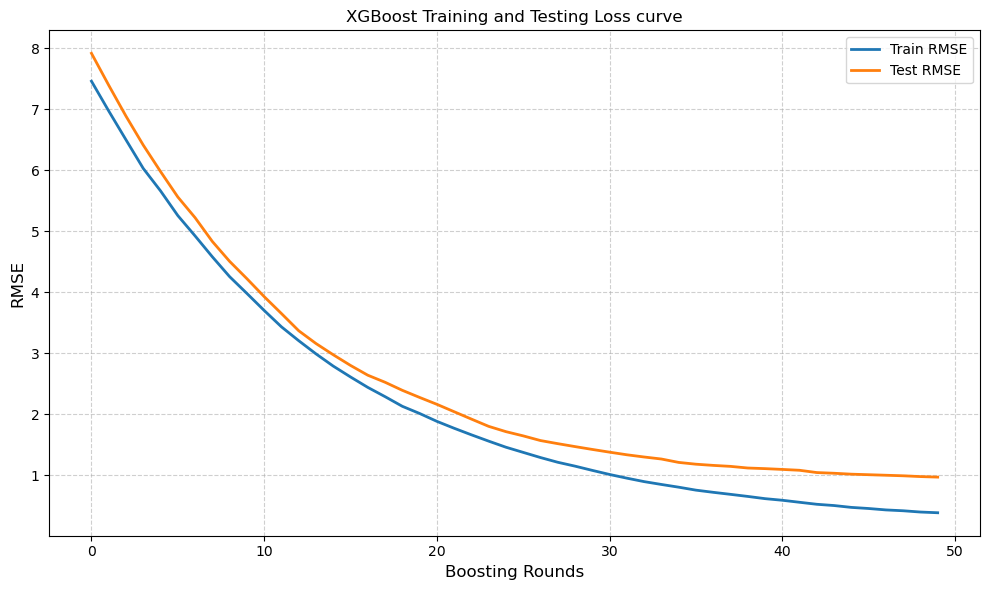

R² Score: 0.987
RMSE: 0.969
MAE: 0.569


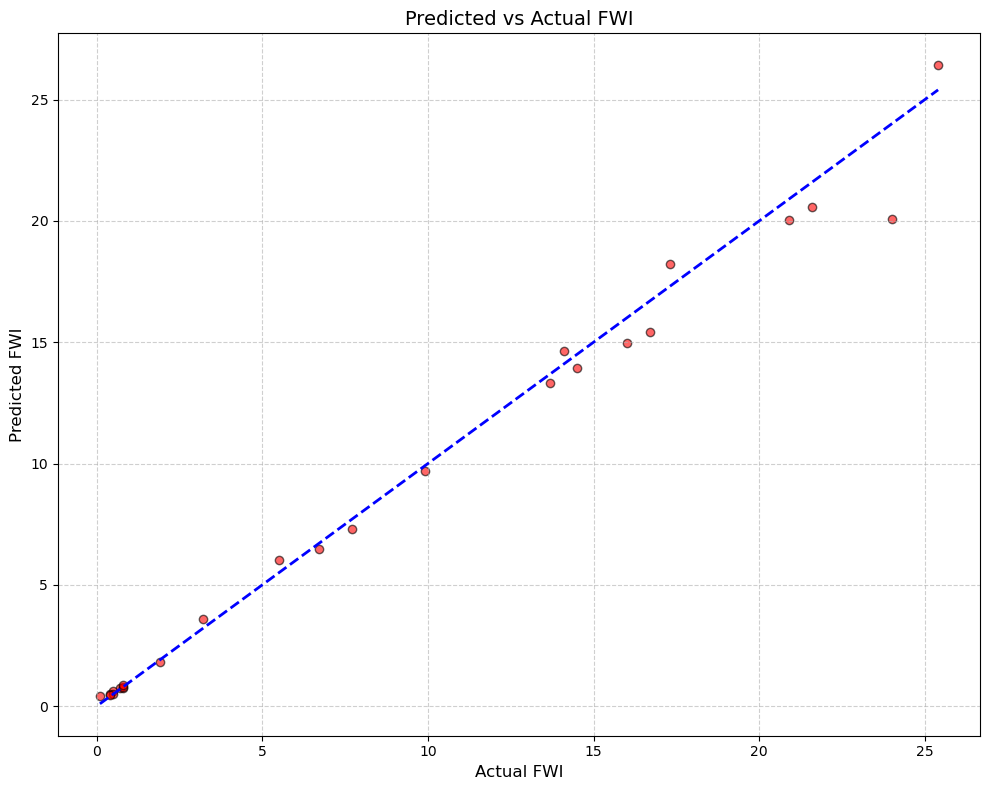

   day month  year  Temperature  RH  Ws  Rain  FFMC  DMC    DC  ISI  BUI  FWI  \
0    1     6  2012           32  71  12   0.7  59.8  2.5   8.2  0.6  2.8  0.2   
1    2     6  2012           30  73  13   4.0  59.8  2.7   7.8  0.6  2.9  0.2   
2    3     6  2012           29  80  14   2.0  59.8  2.2   7.6  0.3  2.6  0.1   
3    4     6  2012           30  64  14   0.0  79.4  5.2  15.4  2.2  5.6  1.0   
4    5     6  2012           32  60  14   0.2  77.1  6.0  17.6  1.8  6.5  0.9   

   Classes  
0        0  
1        0  
2        0  
3        0  
4        0   



In [50]:

features = ["Temperature","RH","Ws", "Rain","FFMC","DMC","DC","ISI","BUI"] #input features
target = 'FWI' #target variable

X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=0) #splits the dataset to 80% training and 20% testing 


xgb_train = xgb.DMatrix(X_train, y_train) #converts the inputs to a DMatrix object 
xgb_test = xgb.DMatrix(X_test, y_test)

#Parameters for the XGBoost model is defined 
params = { 
    "objective": "reg:squarederror",
    "learning_rate": 0.0835,
    "max_depth": 4,
    "subsample": 0.8,
    "colsample_bytree": 0.8,
    "lambda": 1,
    "alpha": 0.1,
    "seed": 42
}
n=50 #number of boosting rounds/n_estimators = n is set to 50

evals_result = {} #stores the training and testing evaluation values 

model = xgb.train(params=params,dtrain=xgb_train,num_boost_round=n, evals=[(xgb_train, 'train'), (xgb_test, 'test')],evals_result=evals_result, verbose_eval=False) #model is trained 

train_rmse_val = evals_result['train']['rmse'] #all training rmse values are extracted
test_rmse_val = evals_result['test']['rmse'] #all testing rmse values are extracted

plt.figure(figsize=(10, 6)) #loss curve is plotted using the rmse values for training and testing 
plt.plot(train_rmse_val, label='Train RMSE', linewidth=2)
plt.plot(test_rmse_val, label='Test RMSE', linewidth=2)
plt.xlabel('Boosting Rounds', fontsize=12)
plt.ylabel('RMSE', fontsize=12)
plt.title('XGBoost Training and Testing Loss curve', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

preds = model.predict(xgb_test)  #the FWI is predicted for the testing dataset 
r2 = r2_score(y_test, preds)     #calculates the r2 value
rmse = np.sqrt(mean_squared_error(y_test, preds)) #calculates the RMSE value
mae = np.mean(np.abs((y_test - preds))) #calculates the mean absolute error

print(f"R² Score: {r2:.3f}") #r2 score is calculated
print(f"RMSE: {rmse:.3f}") #rmse score is calculated
print(f"MAE: {mae:.3f}") #Mean absolute error is calculaeted

plt.figure(figsize=(10, 8))
plt.scatter(y_test, preds, color='red', alpha=0.6, edgecolor='black') #the predicted Vs Actual plot is plotted 
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2) 
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


print(df.head(), '\n') 


**Model 2 - Only weather data**

1) XGBoost

[I 2025-11-09 14:10:56,695] A new study created in memory with name: no-name-352f3aa2-5aab-47c7-adea-6cd8fc1fd3f1


  0%|          | 0/1000 [00:00<?, ?it/s]

[0]	test-rmse:6.92774
[1]	test-rmse:6.06000
[2]	test-rmse:5.84499
[3]	test-rmse:5.28251
[4]	test-rmse:4.95525
[5]	test-rmse:4.91647
[6]	test-rmse:4.89229
[7]	test-rmse:4.76606
[8]	test-rmse:4.60048
[9]	test-rmse:4.46737
[10]	test-rmse:4.47093
[11]	test-rmse:4.52577
[12]	test-rmse:4.57971
[13]	test-rmse:4.64612
[14]	test-rmse:4.62428
[15]	test-rmse:4.61946
[16]	test-rmse:4.62840
[17]	test-rmse:4.69069
[18]	test-rmse:4.74389
[19]	test-rmse:4.77961
[20]	test-rmse:4.76489
[21]	test-rmse:4.78194
[22]	test-rmse:4.80427
[23]	test-rmse:4.83384
[24]	test-rmse:4.86337
[25]	test-rmse:4.86144
[26]	test-rmse:4.86061
[27]	test-rmse:4.86406
[28]	test-rmse:4.86024
[29]	test-rmse:4.85615
[30]	test-rmse:4.87376
[31]	test-rmse:4.90034
[32]	test-rmse:4.90718
[33]	test-rmse:4.88517
[34]	test-rmse:4.87510
[35]	test-rmse:4.88363
[36]	test-rmse:4.87886
[37]	test-rmse:4.87445
[38]	test-rmse:4.88448
[39]	test-rmse:4.89899
[40]	test-rmse:4.90678
[41]	test-rmse:4.92415
[42]	test-rmse:4.94080
[43]	test-rmse:4.9349

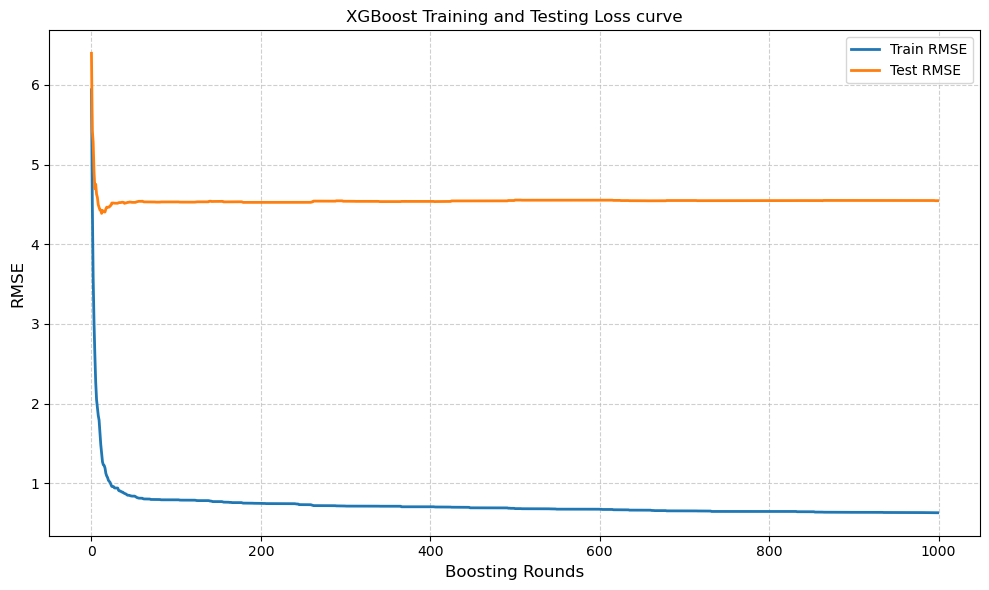

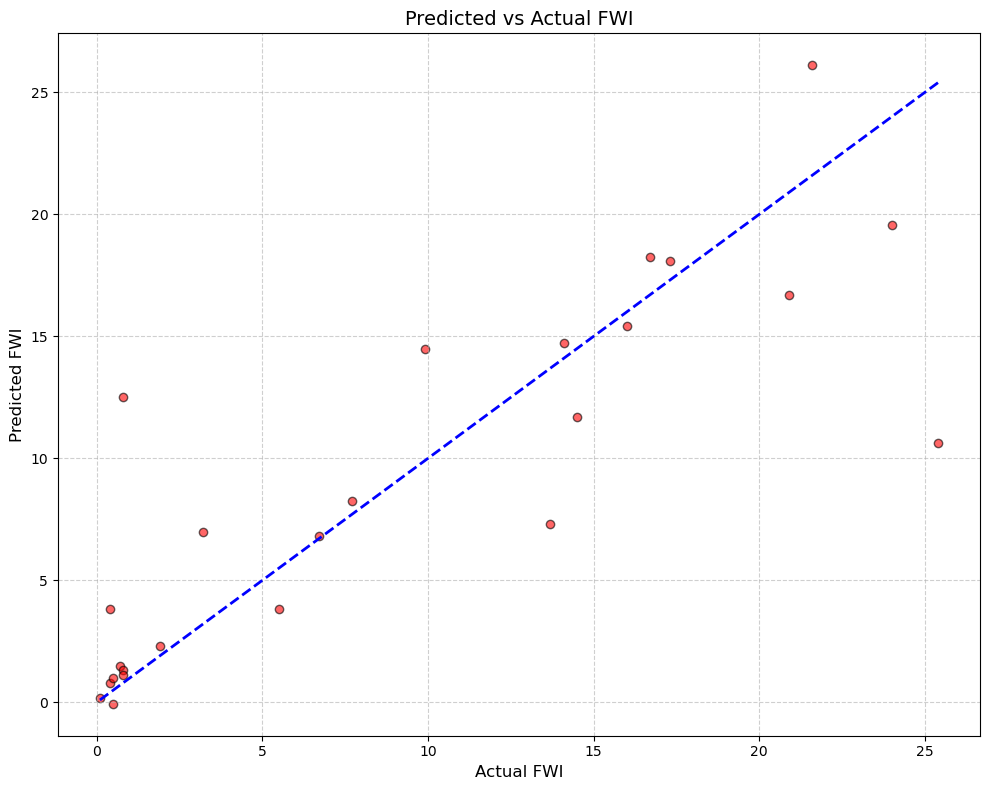

In [51]:

features = ["Temperature","RH","Ws", "Rain"] #input features used
target = 'FWI' #target variable

X = df[features] #input features
y = df[target]  #target

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=0) #splits the dataset to 80% training and 20% testing 

xgb_train = xgb.DMatrix(X_train, y_train) #converts the inputs to a DMatrix object 
xgb_test = xgb.DMatrix(X_test, y_test)


def objective(trial): #the hyperparameter tuning objective function is defined 
    params = {
        "objective": "reg:squarederror",
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.5),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "lambda": trial.suggest_float("lambda", 1e-8, 5),
        "alpha": trial.suggest_float("alpha", 1e-8, 5),
        "seed": 42
    }
    
    model = xgb.train(params=params, dtrain=xgb_train, num_boost_round=100, #model is trained using the intially defined parameters
                      evals=[(xgb_test, 'test')],
                      verbose_eval=True)
    
    preds = model.predict(xgb_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    return rmse

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=1000, show_progress_bar=True)
best_params = study.best_params.copy()
best_params['objective'] = 'reg:squarederror'
best_params['seed'] = 42
print ("Best hyperparameters:", best_params)  #using optuna the best parameters are found 


evals_result = {}
final_model = xgb.train(   #the final model is trained on the best parameters
    params=best_params,
    dtrain=xgb_train,
    num_boost_round=1000,
    evals=[(xgb_train, 'train'), (xgb_test, 'test')],
    evals_result=evals_result,
    verbose_eval=True
)

preds = final_model.predict(xgb_test)   #the FWI is predicted for the testing dataset 
r2 = r2_score(y_test, preds)   #calculates the r2 value
rmse = np.sqrt(mean_squared_error(y_test, preds))  #calculates the RMSE value
mae = np.mean(np.abs((y_test - preds)))#calculates the mean absolute error

print(f"R² Score: {r2:.3f}") #r2 score is calculated
print(f"RMSE: {rmse:.3f}") #rmse score is calculated
print(f"MAE: {mae:.3f}") #Mean absolute error is calculaeted

train_rmse_val = evals_result['train']['rmse'] #all training rmse values are extracted
test_rmse_val = evals_result['test']['rmse'] #all testing rmse values are extracted

plt.figure(figsize=(10, 6))
plt.plot(train_rmse_val, label='Train RMSE', linewidth=2)
plt.plot(test_rmse_val, label='Test RMSE', linewidth=2)
plt.xlabel('Boosting Rounds', fontsize=12)
plt.ylabel('RMSE', fontsize=12)
plt.title('XGBoost Training and Testing Loss curve', fontsize=12) #loss curve is plotted
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 8))
plt.scatter(y_test, preds, color='red', alpha=0.6, edgecolor='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2)  #Predicted VS Actual plot is plotted
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show() 

#reference: https://www.geeksforgeeks.org/machine-learning/implementation-of-xgboost-extreme-gradient-boosting/
#reference: https://xgboost.readthedocs.io/en/stable/python/examples/evals_result.html
#reference: hhttps://machinelearningmastery.com/tune-xgboost-performance-with-learning-curves/ttps://machinelearningmastery.com/tune-xgboost-performance-with-learning-curves/   (to confirm the shape of the learning curve)
#reference: https://github.com/ishandandekar/misc/blob/8711f9bcd8866ed3f220b2bf3f647993c6884283/xgboost_optuna.py#L15-L17

XGBoost Regressor

[I 2025-11-09 14:15:35,366] A new study created in memory with name: no-name-117418ba-8c05-4311-b05c-feb696e4c99f
[I 2025-11-09 14:15:35,575] Trial 0 finished with value: 3.3738493197367587 and parameters: {'n_estimators': 995, 'max_depth': 4, 'learning_rate': 0.25830457721330063, 'subsample': 0.5017471902168598, 'colsample_bytree': 0.5259515256282477, 'reg_lambda': 2.204410103457554, 'reg_alpha': 1.6976693951131283}. Best is trial 0 with value: 3.3738493197367587.
[I 2025-11-09 14:15:35,683] Trial 1 finished with value: 3.941410778118011 and parameters: {'n_estimators': 283, 'max_depth': 5, 'learning_rate': 0.2120593392669766, 'subsample': 0.7523928158945216, 'colsample_bytree': 0.7925488639894642, 'reg_lambda': 3.5873495896738814, 'reg_alpha': 1.3316786446881743}. Best is trial 0 with value: 3.3738493197367587.
[I 2025-11-09 14:15:35,811] Trial 2 finished with value: 4.054874046960721 and parameters: {'n_estimators': 246, 'max_depth': 9, 'learning_rate': 0.03707452003786173, 'subsamp

XGBoost R²: 0.8415665302381012


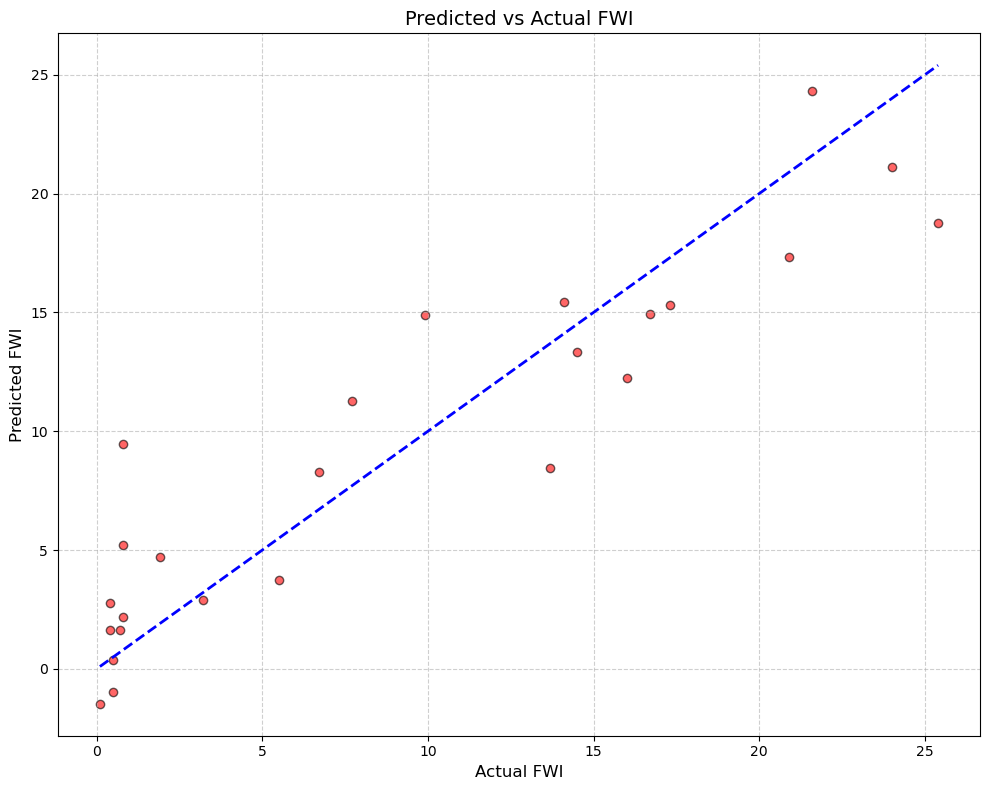

In [52]:

features = ["Temperature","RH","Ws","Rain","day"] #selected input features 
target = "FWI" #target varaible 

X = df[features] #input features
y = df[target]  #target 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0) #the dataset is split into 80% testing and 20% training 

# the objective function for the optuna hyperparameter optimisation is defined 
def xgb_objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.3),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-8, 5),
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-8, 5),
        "random_state": 42
    }
    
    model = xgb.XGBRegressor(**params) #model is trainned 
    model.fit(X_train, y_train)
    preds = model.predict(X_test) #model trained is used to predict the FWI using the test dataset 
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    return rmse

study_xgb = optuna.create_study(direction='minimize') #hyperparameters are optimised
study_xgb.optimize(xgb_objective, n_trials=30)
best_xgb_params = study_xgb.best_params
best_xgb_params['random_state'] = 42

xgb_model = xgb.XGBRegressor(**best_xgb_params) #model is trained on the best hyperparemters
xgb_model.fit(X_train, y_train)
xgb_preds = xgb_model.predict(X_test) #trained model on best hyperparameters are used to predict the FWI

print("XGBoost R²:", r2_score(y_test, xgb_preds))

plt.figure(figsize=(10, 8))
plt.scatter(y_test, xgb_preds, color='red', alpha=0.6, edgecolor='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2) 
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14) #the predited vs Actual plot is plotted 
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

#reference: https://medium.com/@fraidoonomarzai99/xgboost-regression-in-depth-cb2b3f623281


Light GBM

[I 2025-11-09 14:15:39,911] A new study created in memory with name: no-name-c0369b41-93e5-42d7-9604-e22b73eb27e9
[I 2025-11-09 14:15:39,936] Trial 0 finished with value: 3.6805204124360085 and parameters: {'n_estimators': 353, 'num_leaves': 77, 'max_depth': 11, 'learning_rate': 0.15940580242989077, 'subsample': 0.995177332591859, 'colsample_bytree': 0.9114372658450259, 'reg_alpha': 4.693822106046505, 'reg_lambda': 0.06110268158265486}. Best is trial 0 with value: 3.6805204124360085.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:40,006] Trial 1 finished with value: 3.7033744524904098 and parameters: {'n_estimators': 934, 'num_leaves': 121, 'max_depth': 4, 'learning_rate': 0.06630058633080527, 'subsample': 0.7068062245931037, 'colsample_bytree': 0.994454734104797, 'reg_alpha': 3.595095599180616, 'reg_lambda': 2.7681328667227763}. Best is trial 0 with value: 3.6805204124360085.
[I 2025-11-09 14:15:40,029] Trial 2 finished with value: 3.583411811420902 and parameters: {'n_estimators': 256, 'num_leaves': 127, 'max_depth': 15, 'learning_rate': 0.048164920984149345, 'subsample': 0.980522728685278, 'colsample_bytree': 0.9769347810227642, 'reg_alpha': 4.521334257009599, 'reg_lambda': 0.518792078803535}. Best is trial 2 with value: 3.583411811420902.
[I 2025-11-09 14:15:40,056] Trial 3 finished with value: 3.9763166589105876 and parameters: {'n_estimators': 318, 'num_leaves': 40, 'max_depth': 7, 'learning_rate': 0.21047824454528016, 'subsample': 0.891491119618098, 'colsample_bytree': 0.8265739434476

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:40,136] Trial 6 finished with value: 3.590319449192711 and parameters: {'n_estimators': 369, 'num_leaves': 154, 'max_depth': 10, 'learning_rate': 0.24256050121605582, 'subsample': 0.8775017704175095, 'colsample_bytree': 0.8962883580268013, 'reg_alpha': 4.837458550729316, 'reg_lambda': 2.8033860866777207}. Best is trial 2 with value: 3.583411811420902.
[I 2025-11-09 14:15:40,169] Trial 7 finished with value: 3.64833745067231 and parameters: {'n_estimators': 355, 'num_leaves': 168, 'max_depth': 10, 'learning_rate': 0.09868980121584073, 'subsample': 0.8380237076457231, 'colsample_bytree': 0.8064616543286663, 'reg_alpha': 0.6701419213233406, 'reg_lambda': 0.10512807880107944}. Best is trial 2 with value: 3.583411811420902.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:40,198] Trial 8 finished with value: 3.708868328603322 and parameters: {'n_estimators': 460, 'num_leaves': 190, 'max_depth': 10, 'learning_rate': 0.28314522392018, 'subsample': 0.6979890755293788, 'colsample_bytree': 0.9603125073509587, 'reg_alpha': 4.974323098657286, 'reg_lambda': 3.504340864312719}. Best is trial 2 with value: 3.583411811420902.
[I 2025-11-09 14:15:40,230] Trial 9 finished with value: 3.880393013639642 and parameters: {'n_estimators': 438, 'num_leaves': 101, 'max_depth': 10, 'learning_rate': 0.1665886495857246, 'subsample': 0.8227593212362903, 'colsample_bytree': 0.9288616910400459, 'reg_alpha': 2.9923691017871903, 'reg_lambda': 0.6813381361310361}. Best is trial 2 with value: 3.583411811420902.
[I 2025-11-09 14:15:40,294] Trial 10 finished with value: 3.498311045693996 and parameters: {'n_estimators': 697, 'num_leaves': 137, 'max_depth': 15, 'learning_rate': 0.015000008501897422, 'subsample': 0.6034055190708693, 'colsample_bytree': 0.685614317140

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-11-09 14:15:40,359] Trial 11 finished with value: 3.493426204864787 and parameters: {'n_estimators': 698, 'num_leaves': 136, 'max_depth': 15, 'learning_rate': 0.012692130829039965, 'subsample': 0.6062360970210102, 'colsample_bytree': 0.6335282896324144, 'reg_alpha': 1.5708038155497117, 'reg_lambda': 1.6502522692412611}. Best is trial 11 with value: 3.493426204864787.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:40,422] Trial 12 finished with value: 3.489836566318008 and parameters: {'n_estimators': 707, 'num_leaves': 147, 'max_depth': 15, 'learning_rate': 0.01176987258942847, 'subsample': 0.6164162946219173, 'colsample_bytree': 0.6228318387053788, 'reg_alpha': 1.7552055736319179, 'reg_lambda': 1.684025385660874}. Best is trial 12 with value: 3.489836566318008.
[I 2025-11-09 14:15:40,485] Trial 13 finished with value: 3.4824414031237017 and parameters: {'n_estimators': 677, 'num_leaves': 194, 'max_depth': 13, 'learning_rate': 0.011988769845229733, 'subsample': 0.6059121690913443, 'colsample_bytree': 0.6041264309380454, 'reg_alpha': 1.9092296707541119, 'reg_lambda': 1.5968065579215835}. Best is trial 13 with value: 3.4824414031237017.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:40,550] Trial 14 finished with value: 4.140218722172433 and parameters: {'n_estimators': 713, 'num_leaves': 196, 'max_depth': 13, 'learning_rate': 0.11071164008146762, 'subsample': 0.6825627960020768, 'colsample_bytree': 0.6038384892137476, 'reg_alpha': 0.09033104225099131, 'reg_lambda': 1.8849403480569304}. Best is trial 13 with value: 3.4824414031237017.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:40,634] Trial 15 finished with value: 4.038119152642859 and parameters: {'n_estimators': 888, 'num_leaves': 174, 'max_depth': 13, 'learning_rate': 0.10978758860744754, 'subsample': 0.7586685354987095, 'colsample_bytree': 0.7089075537287268, 'reg_alpha': 2.177734969083166, 'reg_lambda': 2.176027871851433}. Best is trial 13 with value: 3.4824414031237017.
[I 2025-11-09 14:15:40,693] Trial 16 finished with value: 3.5679156505829925 and parameters: {'n_estimators': 592, 'num_leaves': 158, 'max_depth': 13, 'learning_rate': 0.03630511981290234, 'subsample': 0.6487850522267525, 'colsample_bytree': 0.7137115295278909, 'reg_alpha': 2.3675059298258665, 'reg_lambda': 1.14315980289239}. Best is trial 13 with value: 3.4824414031237017.
[I 2025-11-09 14:15:40,719] Trial 17 finished with value: 3.617672326140167 and parameters: {'n_estimators': 119, 'num_leaves': 181, 'max_depth': 12, 'learning_rate': 0.0832853147792225, 'subsample': 0.7693452815435596, 'colsample_bytree': 0.66521

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:40,792] Trial 18 finished with value: 4.153776798686562 and parameters: {'n_estimators': 830, 'num_leaves': 200, 'max_depth': 8, 'learning_rate': 0.12909075856529656, 'subsample': 0.6483182783974369, 'colsample_bytree': 0.6022352979963906, 'reg_alpha': 1.9005668846175663, 'reg_lambda': 2.3182203413771596}. Best is trial 13 with value: 3.4824414031237017.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:40,856] Trial 19 finished with value: 3.5479104693128654 and parameters: {'n_estimators': 596, 'num_leaves': 150, 'max_depth': 14, 'learning_rate': 0.036498225851617085, 'subsample': 0.731174989837266, 'colsample_bytree': 0.7504521240418459, 'reg_alpha': 3.853163039502255, 'reg_lambda': 1.2879535594315685}. Best is trial 13 with value: 3.4824414031237017.
[I 2025-11-09 14:15:40,937] Trial 20 finished with value: 3.424751972694475 and parameters: {'n_estimators': 789, 'num_leaves': 170, 'max_depth': 12, 'learning_rate': 0.010710574719467859, 'subsample': 0.6496752117709885, 'colsample_bytree': 0.7612977721235342, 'reg_alpha': 0.40898926771305866, 'reg_lambda': 4.9724678059804255}. Best is trial 20 with value: 3.424751972694475.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000031 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:41,011] Trial 21 finished with value: 3.4230013751856116 and parameters: {'n_estimators': 794, 'num_leaves': 170, 'max_depth': 12, 'learning_rate': 0.01053665617732481, 'subsample': 0.6466392433156309, 'colsample_bytree': 0.748476590506118, 'reg_alpha': 0.09008947269579282, 'reg_lambda': 4.76770530483394}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:41,085] Trial 22 finished with value: 3.7359219067005798 and parameters: {'n_estimators': 815, 'num_leaves': 173, 'max_depth': 12, 'learning_rate': 0.039053739051482364, 'subsample': 0.6556898305675353, 'colsample_bytree': 0.7666009971136986, 'reg_alpha': 0.07497459103643545, 'reg_lambda': 4.757553904157168}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:41,172] Trial 23 finished with value: 3.9602227514727644 and parameters: {'n_estimators': 971, 'num_leaves': 183, 'max_depth': 12, 'learning_rate': 0.06627383588698234, 'subsample': 0.6691591602866209, 'colsample_bytree': 0.853103644367831, 'reg_alpha': 0.6007588199723097, 'reg_lambda': 4.060802139432624}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:41,252] Trial 24 finished with value: 3.9863844578500713 and parameters: {'n_estimators': 806, 'num_leaves': 164, 'max_depth': 8, 'learning_rate': 0.08661741038816653, 'subsample': 0.7271713700146168, 'colsample_bytree': 0.759803956028399, 'reg_alpha': 0.523767360155195, 'reg_lambda': 4.352427304183024}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:41,311] Trial 25 finished with value: 3.5647586433654093 and parameters: {'n_estimators': 633, 'num_leaves': 30, 'max_depth': 11, 'learning_rate': 0.029443204230444133, 'subsample': 0.626919285001092, 'colsample_bytree': 0.8506465103029054, 'reg_alpha': 1.2465662327703575, 'reg_lambda': 4.297529503003899}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:41,385] Trial 26 finished with value: 3.8697212057726205 and parameters: {'n_estimators': 783, 'num_leaves': 200, 'max_depth': 14, 'learning_rate': 0.061692784395406486, 'subsample': 0.7842711890510738, 'colsample_bytree': 0.730

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:41,464] Trial 27 finished with value: 4.2548736101887705 and parameters: {'n_estimators': 897, 'num_leaves': 184, 'max_depth': 11, 'learning_rate': 0.135921856689061, 'subsample': 0.6353422541039423, 'colsample_bytree': 0.6580593449623884, 'reg_alpha': 0.44277321699129435, 'reg_lambda': 4.985744054645689}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:41,555] Trial 28 finished with value: 3.460218187646255 and parameters: {'n_estimators': 530, 'num_leaves': 141, 'max_depth': 9, 'learning_rate': 0.011031890366141592, 'subsample': 0.6818142241826001, 'colsample_bytree': 0.7765374618297369, 'reg_alpha': 1.1161120274423486, 'reg_lambda': 3.5803447749300403}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:41,613] Trial 29 finished with value: 3.6612453660831057 and parameters: {'n_estimators': 530, 'num_leaves': 112, 'max_depth': 8, 'learning_rate': 0.05223180835621445, 'subsample': 0.7374442708284449, 'colsample_bytree': 0.7791364032531551, 'reg_alpha': 0.9726535685418541, 'reg_lambda': 3.6188275379549957}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:41,676] Trial 30 finished with value: 4.001482160766292 and parameters: {'n_estimators': 761, 'num_leaves': 77, 'max_depth': 9, 'learning_rate': 0.07951457160706003, 'subsample': 0.6886353499685518, 'colsample_bytree': 0.7869038745955249, 'reg_alpha': 0.8897641596747903, 'reg_lambda': 4.460920654842078}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:41,743] Trial 31 finished with value: 3.4864833791039094 and parameters: {'n_estimators': 638, 'num_leaves': 143, 'max_depth': 12, 'learning_rate': 0.025167547137331707, 'subsample': 0.664069648442156, 'colsample_bytree': 0.8805881883270379, 'reg_alpha': 0.3967744661750425, 'reg_lambda': 3.97321578811081}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:41,800] Trial 32 finished with value: 3.4398910845866193 and parameters: {'n_estimators': 536, 'num_leaves': 160, 'max_depth': 9, 'learning_rate': 0.01417983251566502, 'subsample': 0.6281021991228641, 'colsample_bytree': 0.7386151548149111, 'reg_alpha': 1.3558156072638694, 'reg_lambda': 3.2709623131634835}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:41,857] Trial 33 finished with value: 3.60840519176985 and parameters: {'n_estimators': 553, 'num_leaves': 158, 'max_depth': 7, 'learning_rate': 0.04186729969709925, 'subsample': 0.7091777415285959, 'colsample_bytree': 0.7378117534519016, 'reg_alpha': 1.3306498653381693, 'reg_lambda': 3.1965568703718654}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:41,962] Trial 34 finished with value: 3.497432890189487 and parameters: {'n_estimators': 509, 'num_leaves': 125, 'max_depth': 9, 'learning_rate': 0.029627481538581732, 'subsample': 0.6365591839543893, 'colsample_bytree': 0.7013463965986824, 'reg_alpha': 0.3500493019424243, 'reg_lambda': 2.8856590125683708}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:42,009] Trial 35 finished with value: 3.5654273242501957 and parameters: {'n_estimators': 417, 'num_leaves': 136, 'max_depth': 9, 'learning_rate': 0.05729708648497305, 'subsample': 0.6804301080535957, 'colsample_bytree': 0.7917808934624564, 'reg_alpha': 0.8258610366751652, 'reg_lambda': 3.43885101259772}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:42,085] Trial 36 finished with value: 3.747933624758817 and parameters: {'n_estimators': 860, 'num_leaves': 118, 'max_depth': 6, 'learning_rate': 0.0465864870637927, 'subsample': 0.716759380074121, 'colsample_bytree': 0.7313716364297669, 'reg_alpha': 1.4288122530490774, 'reg_lambda': 4.5259263082704555}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:42,202] Trial 37 finished with value: 3.5650007849944503 and parameters: {'n_estimators': 969, 'num_leaves': 166, 'max_depth': 3, 'learning_rate': 0.021678818052309264, 'subsample': 0.6317644418654074, 'colsample_bytree': 0.8328613012688891, 'reg_alpha': 1.1319939145787332, 'reg_lambda': 3.786668002997875}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:42,306] Trial 38 finished with value: 4.567474650664741 and parameters: {'n_estimators': 749, 'num_leaves': 158, 'max_depth': 11, 'learning_rate': 0.2277823390432535, 'subsample': 0.9114463137696776, 'colsample_bytree': 0.683261394395646, 'reg_alpha': 0.27883278366695613, 'reg_lambda': 4.150104653056572}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:42,360] Trial 39 finished with value: 4.411082196151947 and parameters: {'n_estimators': 493, 'num_leaves': 130, 'max_depth': 7, 'learning_rate': 0.28487172647027204, 'subsample': 0.9286637472019181, 'colsample_bytree': 0.8120764115020921, 'reg_alpha': 0.7494406303106521, 'reg_lambda': 3.268173736805354}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:42,397] Trial 40 finished with value: 3.5801908558943296 and parameters: {'n_estimators': 291, 'num_leaves': 175, 'max_depth': 9, 'learning_rate': 0.07529724963427038, 'subsample': 0.6696349448761778, 'colsample_bytree': 0.7734991480678035, 'reg_alpha': 3.899055047235744, 'reg_lambda': 2.6570128579357686}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:42,457] Trial 41 finished with value: 3.443003822442611 and parameters: {'n_estimators': 643, 'num_leaves': 189, 'max_depth': 11, 'learning_rate': 0.010948542691330032, 'subsample': 0.6001416379466569, 'colsample_bytree': 0.7491989582715736, 'reg_alpha': 2.067216064208272, 'reg_lambda': 2.997364149702335}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:42,512] Trial 42 finished with value: 3.4445408086504186 and parameters: {'n_estimators': 570, 'num_leaves': 184, 'max_depth': 10, 'learning_rate': 0.010472968071256809, 'subsample': 0.6255872138751242, 'colsample_bytree': 0.7469472721923467, 'reg_alpha': 2.6455429296661688, 'reg_lambda': 2.9951739929340215}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:42,585] Trial 43 finished with value: 3.71770578051218 and parameters: {'n_estimators': 581, 'num_leaves': 187, 'max_depth': 11, 'learning_rate': 0.18411607725060547, 'subsample': 0.6215143469492104, 'colsample_bytree': 0.743739130702367, 'reg_alpha': 2.713270844415802, 'reg_lambda': 3.014080871442789}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:42,648] Trial 44 finished with value: 3.4925613792937074 and parameters: {'n_estimators': 656, 'num_leaves': 178, 'max_depth': 10, 'learning_rate': 0.02620964383363027, 'subsample': 0.6021770027226606, 'colsample_bytree': 0.7177571543369152, 'reg_alpha': 2.4754169734724965, 'reg_lambda': 2.492773027595054}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:42,696] Trial 45 finished with value: 3.557320963573268 and parameters: {'n_estimators': 410, 'num_leaves': 190, 'max_depth': 10, 'learning_rate': 0.050439330854398085, 'subsample': 0.6449500782665235, 'colsample_bytree': 0.7526699644459923, 'reg_alpha': 3.2689082283955404, 'reg_lambda': 2.545391417430324}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:42,752] Trial 46 finished with value: 4.167268451266668 and parameters: {'n_estimators': 611, 'num_leaves': 165, 'max_depth': 12, 'learning_rate': 0.2614659980884975, 'subsample': 0.6145895107695093, 'colsample_bytree': 0.803445534772936, 'reg_alpha': 1.9298094904635072, 'reg_lambda': 2.131417362111315}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:42,825] Trial 47 finished with value: 3.5771463573435747 and parameters: {'n_estimators': 732, 'num_leaves': 172, 'max_depth': 10, 'learning_rate': 0.02291449132286249, 'subsample': 0.6584937718520436, 'colsample_bytree': 0.6919596316003727, 'reg_alpha': 2.7223645948845085, 'reg_lambda': 2.9329397679722087}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:42,883] Trial 48 finished with value: 3.73092033858733 and parameters: {'n_estimators': 662, 'num_leaves': 51, 'max_depth': 14, 'learning_rate': 0.04272629259834564, 'subsample': 0.8135669592944309, 'colsample_bytree': 0.66659

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-11-09 14:15:42,967] Trial 49 finished with value: 3.8416429786325295 and parameters: {'n_estimators': 926, 'num_leaves': 89, 'max_depth': 11, 'learning_rate': 0.07081524095316494, 'subsample': 0.9976972769490823, 'colsample_bytree': 0.7211803348171949, 'reg_alpha': 2.7292109743326094, 'reg_lambda': 4.852195998305657}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:43,026] Trial 50 finished with value: 3.4514218322115453 and parameters: {'n_estimators': 555, 'num_leaves': 151, 'max_depth': 10, 'learning_rate': 0.0121825064439826, 'subsample': 0.8477324739529258, 'colsample_bytree': 0.7640437213625992, 'reg_alpha': 2.12396213706547, 'reg_lambda': 4.563194808473756}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:43,074] Trial 51 finished with value: 3.4615615903510926 and parameters: {'n_estimators': 459, 'num_leaves': 156, 'max_depth': 10, 'learning_rate': 0.0118793321892787, 'subsample': 0.852687947354212, 'colsample_bytree': 0.763661

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:43,136] Trial 52 finished with value: 3.5088630150768223 and parameters: {'n_estimators': 556, 'num_leaves': 190, 'max_depth': 12, 'learning_rate': 0.025741321621261082, 'subsample': 0.8912836301700835, 'colsample_bytree': 0.8216148868019157, 'reg_alpha': 1.5997887641003294, 'reg_lambda': 4.982810769653377}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:43,204] Trial 53 finished with value: 3.5699728266748014 and parameters: {'n_estimators': 683, 'num_leaves': 169, 'max_depth': 13, 'learning_rate': 0.03438798111339254, 'subsample': 0.6199601217195941, 'colsample_bytree': 0.7428613932164142, 'reg_alpha': 3.3260771035243843, 'reg_lambda': 4.311181420538983}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:43,255] Trial 54 finished with value: 3.443389987209327 and parameters: {'n_estimators': 386, 'num_leaves': 150, 'max_depth': 8, 'learning_rate': 0.01964672960074034, 'subsample': 0.8415320755292678, 'colsample_bytree': 0.7944906997937032, 'reg_alpha': 3.0210298740820125, 'reg_lambda': 3.7955501626590165}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:43,299] Trial 55 finished with value: 3.4531097061690956 and parameters: {'n_estimators': 382, 'num_leaves': 179, 'max_depth': 8, 'learning_rate': 0.020089999930256754, 'subsample': 0.8042729301440041, 'colsample_bytree': 0.7

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:43,372] Trial 56 finished with value: 3.720090461731214 and parameters: {'n_estimators': 226, 'num_leaves': 161, 'max_depth': 6, 'learning_rate': 0.09413159236436765, 'subsample': 0.6012723263093105, 'colsample_bytree': 0.6999360109353188, 'reg_alpha': 0.18028885787215154, 'reg_lambda': 3.4252039321684555}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:43,439] Trial 57 finished with value: 3.6021242961410223 and parameters: {'n_estimators': 850, 'num_leaves': 194, 'max_depth': 11, 'learning_rate': 0.055674488565148984, 'subsample': 0.6417733620120423, 'colsample_bytree': 0.7267504754726895, 'reg_alpha': 3.507775755314638, 'reg_lambda': 3.0446775118430653}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:43,482] Trial 58 finished with value: 3.463404182496059 and parameters: {'n_estimators': 322, 'num_leaves': 148, 'max_depth': 7, 'learning_rate': 0.036057369572106715, 'subsample': 0.8253672975015026, 'colsample_bytree': 0.

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:43,559] Trial 59 finished with value: 3.5172164029492254 and parameters: {'n_estimators': 787, 'num_leaves': 183, 'max_depth': 8, 'learning_rate': 0.02034057819851722, 'subsample': 0.7504201016791335, 'colsample_bytree': 0.8279772987310003, 'reg_alpha': 2.495150532935431, 'reg_lambda': 3.3548709142586115}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:43,597] Trial 60 finished with value: 4.687821892591412 and parameters: {'n_estimators': 196, 'num_leaves': 169, 'max_depth': 11, 'learning_rate': 0.0100479083128741, 'subsample': 0.7815016429360107, 'colsample_bytree': 0.7874851480075884, 'reg_alpha': 4.270371809708374, 'reg_lambda': 3.718688350821275}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:43,649] Trial 61 finished with value: 3.5113680226081985 and parameters: {'n_estimators': 463, 'num_leaves': 154, 'max_depth': 10, 'learning_rate': 0.010063673819434646, 'subsample': 0.8670970554828697, 'colsample_bytree': 0.7668010569779548, 'reg_alpha': 2.045276035491292, 'reg_lambda': 4.240770105994837}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:43,707] Trial 62 finished with value: 3.5398793637121586 and parameters: {'n_estimators': 576, 'num_leaves': 145, 'max_depth': 12, 'learning_rate': 0.03308846096430361, 'subsample': 0.8549423299964803, 'colsample_bytree': 0.755

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:43,772] Trial 63 finished with value: 3.6677362588800984 and parameters: {'n_estimators': 618, 'num_leaves': 153, 'max_depth': 9, 'learning_rate': 0.045214305211682924, 'subsample': 0.8301335874522556, 'colsample_bytree': 0.774833018306428, 'reg_alpha': 1.7170286239127557, 'reg_lambda': 4.4250511721191}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:43,898] Trial 64 finished with value: 3.4565467047031664 and parameters: {'n_estimators': 493, 'num_leaves': 176, 'max_depth': 10, 'learning_rate': 0.01939458223167341, 'subsample': 0.8501453786093812, 'colsample_bytree': 0.7111284044891446, 'reg_alpha': 2.3899149658854455, 'reg_lambda': 4.0865718913624605}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:44,006] Trial 65 finished with value: 3.568398438437514 and parameters: {'n_estimators': 719, 'num_leaves': 132, 'max_depth': 12, 'learning_rate': 0.03171399002336463, 'subsample': 0.7007313295660642, 'colsample_bytree': 0.7413053937155867, 'reg_alpha': 3.118455122061623, 'reg_lambda': 4.616434156718135}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:44,071] Trial 66 finished with value: 3.608400508462348 and parameters: {'n_estimators': 510, 'num_leaves': 163, 'max_depth': 9, 'learning_rate': 0.06097890294968111, 'subsample': 0.6128246658744207, 'colsample_bytree': 0.8513983713648177, 'reg_alpha': 2.5966770817395584, 'reg_lambda': 4.851997198694326}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:44,123] Trial 67 finished with value: 3.5481111947484725 and parameters: {'n_estimators': 431, 'num_leaves': 139, 'max_depth': 13, 'learning_rate': 0.017775748837885855, 'subsample': 0.971888071425586, 'colsample_bytree': 0.9943573681420286, 'reg_alpha': 0.619830316087076, 'reg_lambda': 3.6283381783726156}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:44,169] Trial 68 finished with value: 4.028496080013459 and parameters: {'n_estimators': 556, 'num_leaves': 194, 'max_depth': 10, 'learning_rate': 0.29998480919799964, 'subsample': 0.6282988968123291, 'colsample_bytree': 0.8043019375117212, 'reg_alpha': 2.118402555449452, 'reg_lambda': 3.9325413325172427}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:44,219] Trial 69 finished with value: 3.549286956801026 and parameters: {'n_estimators': 384, 'num_leaves': 151, 'max_depth': 8, 'learning_rate': 0.04338234103365199, 'subsample': 0.8414602721338932, 'colsample_bytree': 0.7328754416456992, 'reg_alpha': 1.8289088913903644, 'reg_lambda': 0.014772761029513415}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:44,294] Trial 70 finished with value: 4.378008415314431 and parameters: {'n_estimators': 763, 'num_leaves': 185, 'max_depth': 11, 'learning_rate': 0.16144648692414712, 'subsample': 0.6523567020417945, 'colsample_bytree': 0.7870421816439342, 'reg_alpha': 0.21162965810968903, 'reg_lambda': 0.31199548768891683}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:44,347] Trial 71 finished with value: 3.443532670692679 and parameters: {'n_estimators': 381, 'num_leaves': 178, 'max_depth': 8, 'learning_rate': 0.01775473553790904, 'subsample': 0.8103559750137934, 'colsample_bytree': 0.7926613382645432, 'reg_alpha': 2.968045505473751, 'reg_lambda': 3.0806019859709437}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:44,390] Trial 72 finished with value: 3.4460060303892264 and parameters: {'n_estimators': 353, 'num_leaves': 173, 'max_depth': 7, 'learning_rate': 0.016906864106826132, 'subsample': 0.8107335605670178, 'colsample_bytree': 0.

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:44,436] Trial 73 finished with value: 3.460836331343019 and parameters: {'n_estimators': 246, 'num_leaves': 180, 'max_depth': 6, 'learning_rate': 0.030450508904509385, 'subsample': 0.7969169429504981, 'colsample_bytree': 0.8104563482927348, 'reg_alpha': 3.184159923927673, 'reg_lambda': 3.128057090012489}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:44,515] Trial 74 finished with value: 3.4474740049502475 and parameters: {'n_estimators': 329, 'num_leaves': 171, 'max_depth': 7, 'learning_rate': 0.019853403465810507, 'subsample': 0.7868729608795195, 'colsample_bytree': 0.848022554437207, 'reg_alpha': 3.623332277974114, 'reg_lambda': 2.821966740494394}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:44,563] Trial 75 finished with value: 3.820240205677758 and parameters: {'n_estimators': 342, 'num_leaves': 187, 'max_depth': 5, 'learning_rate': 0.14118577537973995, 'subsample': 0.812224794053003, 'colsample_bytree': 0.8385982656519695, 'reg_alpha': 2.8657307592004466, 'reg_lambda': 2.406305249216881}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:44,611] Trial 76 finished with value: 3.5471427698893994 and parameters: {'n_estimators': 302, 'num_leaves': 161, 'max_depth': 8, 'learning_rate': 0.04959476667085608, 'subsample': 0.7675667404818595, 'colsample_bytree': 0.865304

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:44,664] Trial 77 finished with value: 3.478767732259618 and parameters: {'n_estimators': 369, 'num_leaves': 197, 'max_depth': 7, 'learning_rate': 0.03842945134639424, 'subsample': 0.6315623900979397, 'colsample_bytree': 0.8714659866514511, 'reg_alpha': 3.4736710250766456, 'reg_lambda': 3.0440049707622956}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:44,709] Trial 78 finished with value: 3.5309294759846384 and parameters: {'n_estimators': 281, 'num_leaves': 175, 'max_depth': 9, 'learning_rate': 0.029181883562871318, 'subsample': 0.6679549435530365, 'colsample_bytree': 0.9183282763872593, 'reg_alpha': 2.8818063416249315, 'reg_lambda': 3.5079128421833636}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:44,827] Trial 79 finished with value: 3.74305408855286 and parameters: {'n_estimators': 403, 'num_leaves': 168, 'max_depth': 8, 'learning_rate': 0.11623626061235953, 'subsample': 0.6108967702750681, 'colsample_bytree': 0.7786957616740121, 'reg_alpha': 2.3601259155030583, 'reg_lambda': 3.2971469932705486}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:44,921] Trial 80 finished with value: 3.497672473050805 and parameters: {'n_estimators': 874, 'num_leaves': 59, 'max_depth': 7, 'learning_rate': 0.01786250557715313, 'subsample': 0.6894035488312236, 'colsample_bytree': 0.8178044361920822, 'reg_alpha': 2.6431266138764347, 'reg_lambda': 2.0434092764757885}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:44,974] Trial 81 finished with value: 3.4513543320075866 and parameters: {'n_estimators': 333, 'num_leaves': 172, 'max_depth': 7, 'learning_rate': 0.02384004325920251, 'subsample': 0.8313163716393308, 'colsample_bytree': 0.840003120135439, 'reg_alpha': 3.6057889993541417, 'reg_lambda': 2.8780061625601716}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:45,015] Trial 82 finished with value: 3.5382155312245085 and parameters: {'n_estimators': 275, 'num_leaves': 180, 'max_depth': 6, 'learning_rate': 0.017048284328554708, 'subsample': 0.7871835566954317, 'colsample_bytree': 0.862

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:45,067] Trial 83 finished with value: 3.462648859566762 and parameters: {'n_estimators': 434, 'num_leaves': 190, 'max_depth': 8, 'learning_rate': 0.026654824388709496, 'subsample': 0.8178799320648724, 'colsample_bytree': 0.8927551353518656, 'reg_alpha': 4.214747509747103, 'reg_lambda': 2.296398333165659}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:45,114] Trial 84 finished with value: 3.470576872051536 and parameters: {'n_estimators': 354, 'num_leaves': 171, 'max_depth': 5, 'learning_rate': 0.040086423588928805, 'subsample': 0.7995437331438529, 'colsample_bytree': 0.7505897105027701, 'reg_alpha': 3.4240879502164603, 'reg_lambda': 3.1441817893731634}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:45,159] Trial 85 finished with value: 3.518334600598553 and parameters: {'n_estimators': 312, 'num_leaves': 161, 'max_depth': 7, 'learning_rate': 0.014565658627689403, 'subsample': 0.8718428476514496, 'colsample_bytree': 0.7943970052167753, 'reg_alpha': 3.7475802686708337, 'reg_lambda': 2.9025726661634272}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:45,198] Trial 86 finished with value: 4.397472754830115 and parameters: {'n_estimators': 217, 'num_leaves': 176, 'max_depth': 7, 'learning_rate': 0.010114010796296456, 'subsample': 0.8840090200315696, 'colsample_bytree': 0.9

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:45,282] Trial 87 finished with value: 3.5047995689171403 and parameters: {'n_estimators': 829, 'num_leaves': 166, 'max_depth': 9, 'learning_rate': 0.02174842684705164, 'subsample': 0.9088618934612552, 'colsample_bytree': 0.8423161971589229, 'reg_alpha': 2.800892035974721, 'reg_lambda': 3.3619784581324743}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 14:15:45,334] Trial 88 finished with value: 3.6750029564327837 and parameters: {'n_estimators': 398, 'num_leaves': 185, 'max_depth': 12, 'learning_rate': 0.18100753030465178, 'subsample': 0.642588719247854, 'colsample_bytree': 0.7222644542984126, 'reg_alpha': 3.2789781515218372, 'reg_lambda': 3.148026238561025}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:45,383] Trial 89 finished with value: 3.433040848005758 and parameters: {'n_estimators': 182, 'num_leaves': 97, 'max_depth': 6, 'learning_rate': 0.052178554217640796, 'subsample': 0.6604666406652555, 'colsample_bytree': 0.7690624434006237, 'reg_alpha': 3.976214186248013, 'reg_lambda': 2.788804943920288}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:45,453] Trial 90 finished with value: 3.7329999780358447 and parameters: {'n_estimators': 643, 'num_leaves': 88, 'max_depth': 6, 'learning_rate': 0.0559232288546512, 'subsample': 0.6552968068056684, 'colsample_bytree': 0.7702107

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:45,491] Trial 91 finished with value: 3.565699666686511 and parameters: {'n_estimators': 141, 'num_leaves': 98, 'max_depth': 6, 'learning_rate': 0.03520384831945029, 'subsample': 0.6758067162021107, 'colsample_bytree': 0.782406012182374, 'reg_alpha': 4.042546449847573, 'reg_lambda': 2.80576233995682}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000035 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:45,534] Trial 92 finished with value: 3.566858340663639 and parameters: {'n_estimators': 180, 'num_leaves': 199, 'max_depth': 8, 'learning_rate': 0.02582663904990027, 'subsample': 0.624799513935503, 'colsample_bytree': 0.799354904060437, 'reg_alpha': 4.0053152394282385, 'reg_lambda': 2.7187122132938084}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:45,569] Trial 93 finished with value: 4.521377558627088 and parameters: {'n_estimators': 120, 'num_leaves': 99, 'max_depth': 11, 'learning_rate': 0.017477266131855698, 'subsample': 0.6184288266285244, 'colsample_bytree': 0.7413544871130595, 'reg_alpha': 4.537430028898692, 'reg_lambda': 2.562429575930675}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:45,606] Trial 94 finished with value: 3.456901025843358 and parameters: {'n_estimators': 159, 'num_leaves': 118, 'max_depth': 4, 'learning_rate': 0.049017666236589555, 'subsample': 0.6369289224251063, 'colsample_bytree': 0.761557

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 5
[LightGBM] [Info] Start training from score 8.385417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2025-11-09 14:15:45,735] Trial 96 finished with value: 3.677912519545707 and parameters: {'n_estimators': 808, 'num_leaves': 86, 'max_depth': 13, 'learning_rate': 0.06768205766386659, 'subsample': 0.6463042053016204, 'colsample_bytree': 0.7461970353510115, 'reg_alpha': 3.3838643387357488, 'reg_lambda': 2.3976331243839795}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:45,781] Trial 97 finished with value: 3.563450336620388 and parameters: {'n_estimators': 267, 'num_leaves': 93, 'max_depth': 8, 'learning_rate': 0.015802640312339297, 'subsample': 0.7419924128523177, 'colsample_bytree': 0.7287366105090617, 'reg_alpha': 3.5874109544696653, 'reg_lambda': 0.7571485698127294}. Best is trial 21 with value: 3.4230013751856116.
[I 2025-11-09 14:15:45,835] Trial 98 finished with value: 3.5138832818207115 and parameters: {'n_estimators': 453, 'num_leaves': 181, 'max_depth': 6, 'learning_rate': 0.03925620544029005, 'subsample': 0.6003605179512187, 'colsample_bytree': 0.704

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-11-09 14:15:45,922] Trial 99 finished with value: 3.5300969374069253 and parameters: {'n_estimators': 996, 'num_leaves': 109, 'max_depth': 9, 'learning_rate': 0.02417739312800067, 'subsample': 0.766100140424939, 'colsample_bytree': 0.8108936928236643, 'reg_alpha': 4.295251108006865, 'reg_lambda': 3.2792162379918715}. Best is trial 21 with value: 3.4230013751856116.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

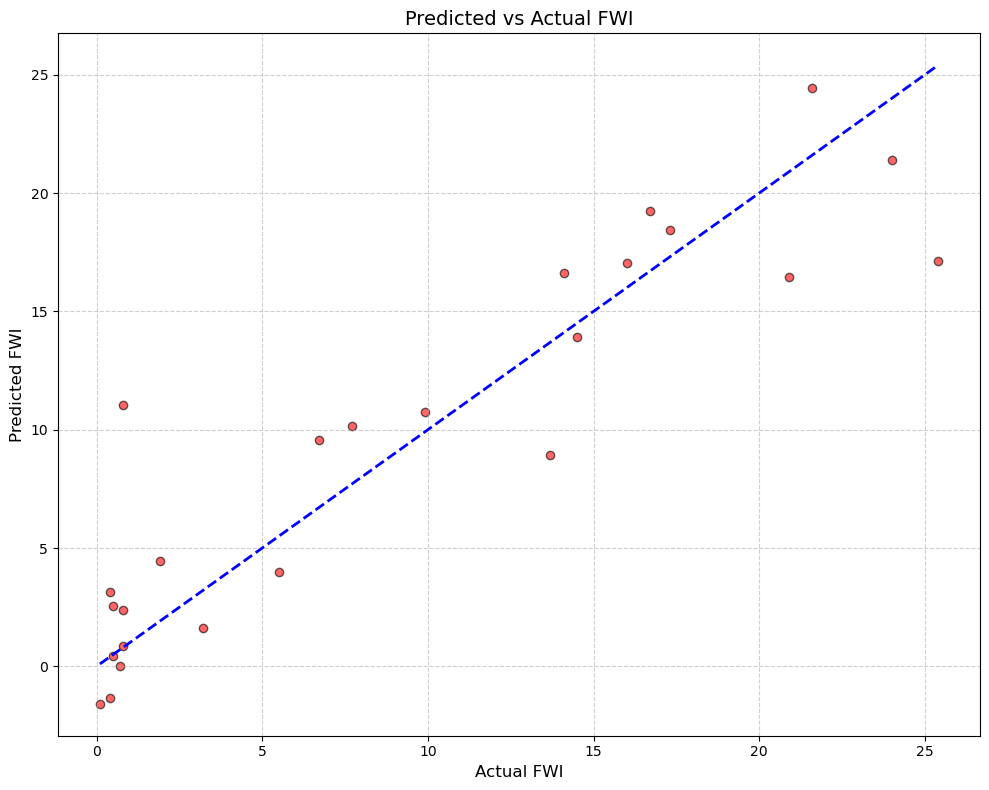

In [53]:

def lgb_objective(trial): #objective function is defined for hyperparameter tuning 
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
        "num_leaves": trial.suggest_int("num_leaves", 20, 200),
        "max_depth": trial.suggest_int("max_depth", 3, 15),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=False),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 5.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 5.0),
        "random_state": 42
    }
    
    model = lgb.LGBMRegressor(**params)  #initially the model is trained for the above sample hyperparameters
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    return rmse

study_lgb = optuna.create_study(direction='minimize') # the hyperparameter optimisation is run for 100 trials
study_lgb.optimize(lgb_objective, n_trials=100)
best_lgb_params = study_lgb.best_params
best_lgb_params['random_state'] = 42

lgb_model = lgb.LGBMRegressor(**best_lgb_params) #the best hyperparameters and the used to train the final Light GBM model
lgb_model.fit(X_train, y_train)
lgb_preds = lgb_model.predict(X_test)

print("LightGBM R²:", r2_score(y_test, lgb_preds))

plt.figure(figsize=(10, 8))
plt.scatter(y_test, lgb_preds, color='red', alpha=0.6, edgecolor='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2) 
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14) #predicted Vs Actual plot
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

#reference: https://forecastegy.com/posts/how-to-use-optuna-to-tune-lightgbm-hyperparameters/


Random Forest Regressor 

[I 2025-11-09 14:15:46,201] A new study created in memory with name: no-name-ce5b7a31-9e33-444a-a659-7e72b6b9c048
[I 2025-11-09 14:15:46,691] Trial 0 finished with value: 4.243095040417132 and parameters: {'n_estimators': 409, 'max_depth': 7, 'min_samples_split': 4, 'min_samples_leaf': 8}. Best is trial 0 with value: 4.243095040417132.
[I 2025-11-09 14:15:46,878] Trial 1 finished with value: 3.9523063247874077 and parameters: {'n_estimators': 137, 'max_depth': 6, 'min_samples_split': 5, 'min_samples_leaf': 3}. Best is trial 1 with value: 3.9523063247874077.
[I 2025-11-09 14:15:47,431] Trial 2 finished with value: 3.8162774392072767 and parameters: {'n_estimators': 478, 'max_depth': 11, 'min_samples_split': 10, 'min_samples_leaf': 1}. Best is trial 2 with value: 3.8162774392072767.
[I 2025-11-09 14:15:48,098] Trial 3 finished with value: 4.1561038157383345 and parameters: {'n_estimators': 575, 'max_depth': 7, 'min_samples_split': 15, 'min_samples_leaf': 7}. Best is trial 2 with value: 3

Random Forest R²: 0.8123494943208025


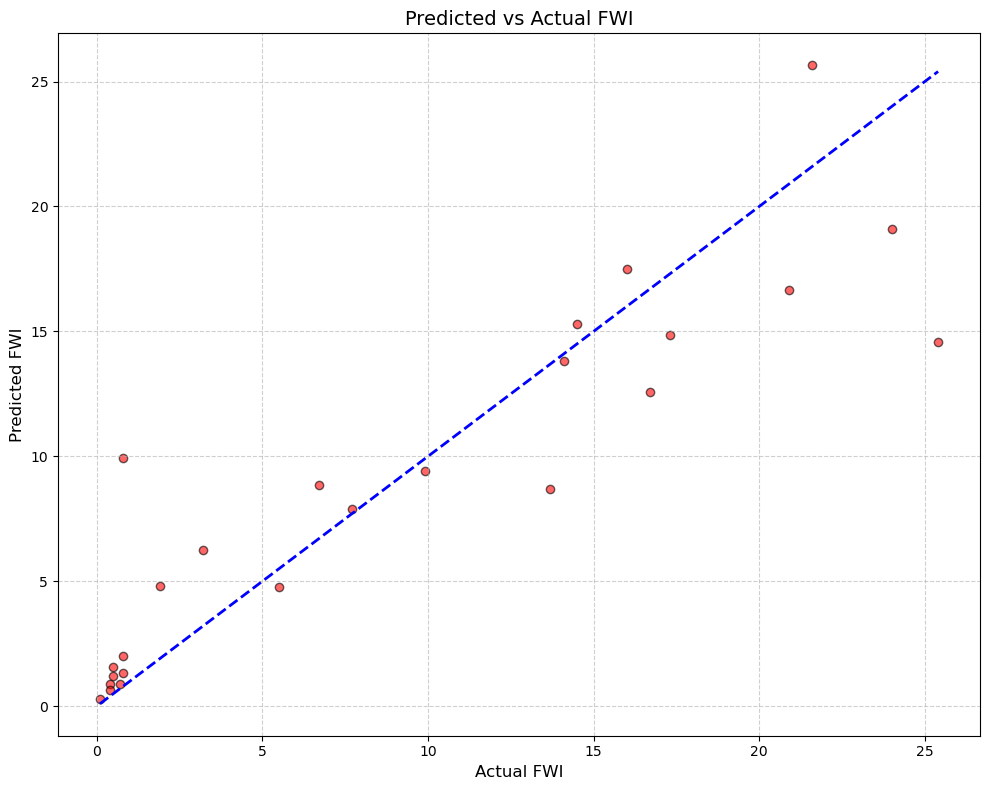

In [54]:

def rf_objective(trial): #objective function for Optuna
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000), #total number of trees in the forest
        "max_depth": trial.suggest_int("max_depth", 3, 15), #maximum depth of each decision tree
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 20), 
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 10),
        "random_state": 42,
        "n_jobs": -1 #uses all CPU cores for faster computaiton
    }
    
    model = RandomForestRegressor(**params)   #random forest model is trained 
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    return rmse

study_rf = optuna.create_study(direction='minimize')  #Optuna hyperparameter optimisation is conducted 
study_rf.optimize(rf_objective, n_trials=100)
best_rf_params = study_rf.best_params
best_rf_params['random_state'] = 42
best_rf_params['n_jobs'] = -1

rf_model = RandomForestRegressor(**best_rf_params)  #using best parameters the model is then trained 
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)

print("Random Forest R²:", r2_score(y_test, rf_preds))


plt.figure(figsize=(10, 8))
plt.scatter(y_test, rf_preds, color='red', alpha=0.6, edgecolor='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2) 
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14) #predicted vs actual plot is plotted 
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

#reference: https://medium.com/@ehsannabatchian/optimizing-random-forest-models-a-deep-dive-into-hyperparameter-tuning-with-optuna-b8e4fe7f3670